In [98]:
from jyquickhelper import add_notebook_menu
add_notebook_menu(first_level=1, last_level=4, header="<font color='blus'>Regression, Classification & Algorithmic Complexity</font>")

# <font color='blus'>What you will learn

> At the end of this course, you will learn :
> - how to manage functions into reusable python packages
> - how to identify and differentiate a classification task from a regression one in supervized learning
> - the overfitting, underfitting and the tricks behind these concepts
> - the relationship between model complexity and data size
> - to identify the kind of task that may be processed with a bunch dataset
> - more details about KNN for classification and regression tasks
> - why and how to scale features for having better performances.

# <font color='blus'> Classification and regresssion

> As a reminder :
> - Given a dataset, a classification task aims to predict classes, such as colors, brand, any kind of qualifier that categorizes an observation.
> - Given a dataset, a regression task aims to predict a digit, a number such as a salary or a size.

# <font color='blus'> Vocabulary

> All the followings terms are equivalent and refer to `X`:
> - independant variable
> - feature
> - predictive variable
> - explanatory variable

> All the followings terms are equivalent and refer to `y`:
> - dependant variable
> - target
> - predicted variable
> - explained variabme

### Quizz

> An algorithm that is able to predict notes for studient, from $[0,20]$, does it solve a classification or a regression problem? 
>> Rep : 

# <font color='blus'>Training process is a supervized tasks

> What does a machine learn ? It learns a mapping function between input variables and output variables.

> 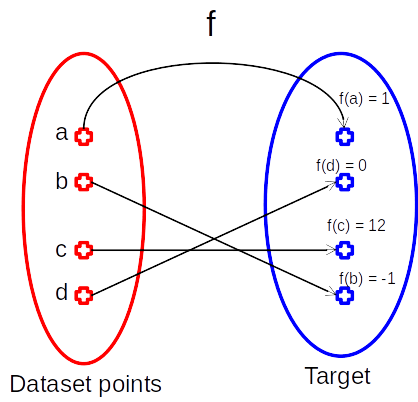

> Training means learning, step by step -iteratively- , a mapping fucntion between a set of data and a target.
>
>> When the target is a unique digital value machine learns a regression task.
>>
>> When the target is a category, machine learnt a classification task.
>
> Once the machine has been trained, scoring process takes place to measure its level of performance when predicting a value (regression) or a category (classification).
>
> Training dataset are observations used to train the algorithm.
>
> Testing dataset are observations that have not been used in the training process. They are unseen data.
>
> Scoring measures the algorithm performance for both, training and testing datasets.
>
> Algorithm complexity is assessed via two concepts : biais and variance.
>
> Let's detail this process step by step consisting in :
> 1. loading data
> 2. exploring data
> 3. qualifying the task dataset allows to perform
> 4. select an algorithm to perform the task
> 5. train the algorithm
> 6. score the algorithm for both train dataset and test dataset
> 7. evaluate biais and variance
> 8. select the proper algorithm depending of criterias to be kept

## <font color='blus'>Loading data

In [2]:
import sklearn.datasets as datasets
import pandas as pd

In [3]:
bunch_cancer = datasets.load_breast_cancer()

In [4]:
print(bunch_cancer.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [5]:
dir(bunch_cancer)

['DESCR',
 'data',
 'data_module',
 'feature_names',
 'filename',
 'frame',
 'target',
 'target_names']

In [6]:
bunch_cancer.target_names

array(['malignant', 'benign'], dtype='<U9')

In [7]:
bunch_cancer.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [8]:
bunch_cancer.feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

> In the previous course, we've developped the `bunch2df` function, converting a dataset into bunch format to a panas dataframe.
>
> This function has been recorded in the package `utils` inside the file `myutils.py`
>
> The package is a folder containing the file `__init__.py`
>
> While doing so, it becomes possible to reuse this conversion function in this notebook.

In [9]:
import myutils
import importlib

> Rather then restaring the notebook kernel when changing module `myutils` at the cost of loss all data in the notebook, the following statement automaticaly reload modules that has been modified. 

> Rather then restaring the notebook kernel when changing module `myutils` at the cost of loss all data in the notebook, the following statement automaticaly reload modules that has been modified. 
>
> This should be stated at the beguining of the notebook.

In [10]:
%load_ext autoreload
%autoreload 2

In [14]:
df_cancer = myutils.bunch2df(bunch_cancer)

In [15]:
df_cancer.shape

(569, 31)

> It may be require to identify quantitative features from qualitative ones.

In [16]:
import numpy as np
list_quant = df_cancer.select_dtypes([np.number]).columns
list_qual = [qual for qual in df_cancer.columns if qual not in list_quant]

In [17]:
len(list_quant), len(list_qual)

(30, 1)

# <font color='blus'> Cycle for scoring an algorithm

## <font color='blus'>Scoring

> When predicted values match values to be predicted, then curve representing $(Y, Y_{pred})$ points are strongly correlated and this correlation is measured with a statistic named $R^2$ score.
>
> Scoring is performed with R² assessment.
>
> In the followings examples, linear algorithm is scored without and with features transformation.

## <font color='blus'>Sample for training

> Variables used for prediction and target are respectivaly splitted into `X` and `y` variables.
>> Features are located into all dataframe columns, except the last one, where values for target are located in.

In [18]:
x_column = df_cancer.columns[:-1].values
y_column = df_cancer.columns[-1:].values

> Variables used for prediction and target are respectivaly splitted into `X` and `y` variables.

In [19]:
X = df_cancer[x_column].values
y = df_cancer[y_column].values

> Sampling is performed with 80% of sample dedicated for training and 20% dedicated for testing. 

In [20]:
from sklearn.model_selection import train_test_split 

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=13, stratify=y)

### <font color='blus'>Stratification

> In the previous call to train_test_split, parameter `stratify` is invoked.
>
> **Why?**
>
> Percentage of malignent observations has to be the same for both train and test samples. It is important because the mapping function between features and target is learned based on the target distribution.
>
> The target distribution issued from test sample has to be as close as possible from what algorithm learned.

>
> Is the splitted sample stratified ?
>
> Then let's write a function that will apply to all samples.

> The funtion `class1_binary_percent` allows to check if samples have been stratified for y, y_train and y_test.
>
> Percentages of positive values (malignant cells) should be roughly balanced.

In [22]:
myutils.class1_binary_percent(y), myutils.class1_binary_percent(y_train), myutils.class1_binary_percent(y_test)

(37.26, 37.27, 37.23)

> $\rightarrow$  **Samples are stratified**.

## <font color='blus'>Training

> In sklearn classes, `fit` method leads to train the algorithm. Fit also referes to how the match function is statisticaly closed to the targeted function. 
>
> With KNN, fit leads to store samples. In fact, no learning takes place.

In [23]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5,p=2)

knn.fit(X_train, y_train.ravel())
score_train = knn.score(X_train, y_train)
print("KNN precision= {}%".format(round(100*score_train,2)))

KNN precision= 95.28%


## <font color='blus'>Testing

> Prediction takes place with stored data from train sample

In [24]:
score_test = knn.score(X_test, y_test)

print("KNN precision= {}%".format(round(100*score_test,2)))

KNN precision= 92.55%


> Why testing sample does provide less performance? 

# <font color='blus'>Underfitting, overfitting, generalization

## <font color='blus'>Presentation

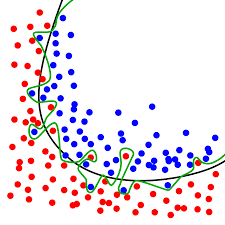

> On the picture above, an algorithm that draws green curve is said "**overfitting**"
>
> Also, an algorithm that draws black curve is said "**underfitting**"
>
> The red curve takes care of every point to separate blue points from red ones. Algorithm has learnt exactly how to identify red points from blue one. This learning process is based on $N$ observations described with $p$ features, mean, $p$ dimensions.
>
> Suppose that, to achieve a such result, algorithm has recorded all relatives positions and many other things with a learning mechanism equivalent to something looking like a "point per point" rule based algorithm. Such algorithm will involve **a lot of parameters**. The more parameters it has, the more **complex** the algorithm is said to be.
>
> What's happen when a new point is added around this border line after the training step ? Due to the fact this new point has not been viewed during training, then it is likely that rules won't apply to this point leading to a false prediction.
>
> If data model is noisy, and this is always the case, then algorithm may be so complex that he also learned the noise. It will predict also noisy results.
>
> The ability for an algorithm to perform well over training dataset is said **overfitting**. 
>
> In a reverse situation, when algorithm have low performance while predicting training dataset is said **underfitting**.
>
> When an algorithm achieves good performances on training dataset and also good performances on testing dataset then it has the ability of **generalization**.  
>
> **Generalization** is the ability, for an algorithm, to learns general concepts (concepts that will be applicable on unseen data) from specific observations (from train dataset). This is a kind of "inductive" reasoning.
>
> On the opposite, deduction reasoning is the action of create knowledge, then, to learn specific concepts, from general observations. 

## <font color='blus'>Bias, variance

> Bias and variance are two concepts to represent a model complexity.
>
> A complex model has the ability to capture all details from a dataset. This mean it has the ability to capture a large range of variability into the model. It has a strong **variance**.
>
> On the opposite, a simple model will capture low variance. Asumptions the model is based on, such as, there is a linear relationship between input values and output values, lead to a **bias** of prediction.
>
> But a biased model will generalize well in the sense the error it produces will not increase dramaticly when unseen data will have to be predicted.

> Illustration below has been built while testing Error along with model complexity 

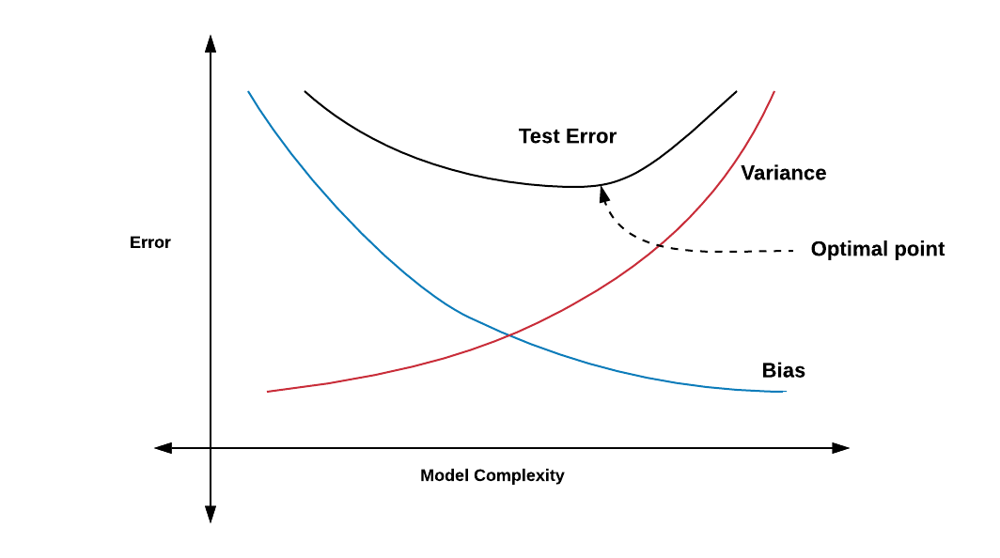

> **To be reminded**
> - Optimized algorithm is the one that minimize the **test errors**
> - Biais and variance assessments are conducted on both training and test datasets
> - High biais / Low variance reflect all the asumptions made that lead to a simplified model. Model variability is low. This mean that model behavior will not change with unseen data from testing dataset.
> - High variance/ Low bias reflect the sensibility for the model to change its behavior when unseen data from testing dataset are predicted.

## <font color='blus'>Reusable training & testing functions

> Scoring

In [25]:
from sklearn.neighbors import KNeighborsClassifier

def get_X_y(df):
    '''Return 2 arrays : X for features and y for target.
    Target is supposed to be the last column.
    '''
    #Select all columns for independants variables
    x_column = df.columns[:-1].values
    
    # Select column from target
    y_column = df.columns[-1:].values

    # Extract values respectivaly from independants variables and target
    X = df[x_column].values
    y = df[y_column].values
    
    return X,y

def binary_training_and_testing(df, pct_train_size, classifier, target_name0, target_name1, is_verbose=False) :
    '''What is the purpose of this function ?
    '''
    # Extract X and y from dataframe
    X, y = get_X_y(df)
    
    # Split dataset into train and test datasets, with the train fraction sized to pct_train_size
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=pct_train_size, random_state=13, stratify=y)

    # Train classfii
    classifier.fit(X_train, y_train.ravel())
    
    # Predictions for train and test datasets
    #y_train_predict = classifier.predict(X_train)
    #y_test_predict = classifier.predict(X_test)
    
    # Score predictions
    score_train = round(100*classifier.score(X_train, y_train),2)
    score_test  = round(100*classifier.score(X_test, y_test),2)
    
    if is_verbose is True :
        print("Classfier precision for train= {}%".format(score_train))
        print("Classifier precision for test= {}%".format(score_test))
    else:
        pass
    return score_train, score_test


### <font color='blus'>Reusable training & testing process

In [26]:
knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_cancer, pct_train_size, classifier, target_name0, target_name1)
print(pct_train, pct_test)

95.23 91.81


### <font color='blus'>Exercice

> For KNN classifier, write a function that searchs for the number of neighbors ranging from 2 to 20 to get the best score. Fraction for train sample will be given as a parameter function.
>
> Function will plot a curve with:
> - Number of neighbors for horizontal axis
> - Mean accuracy on vertical axis

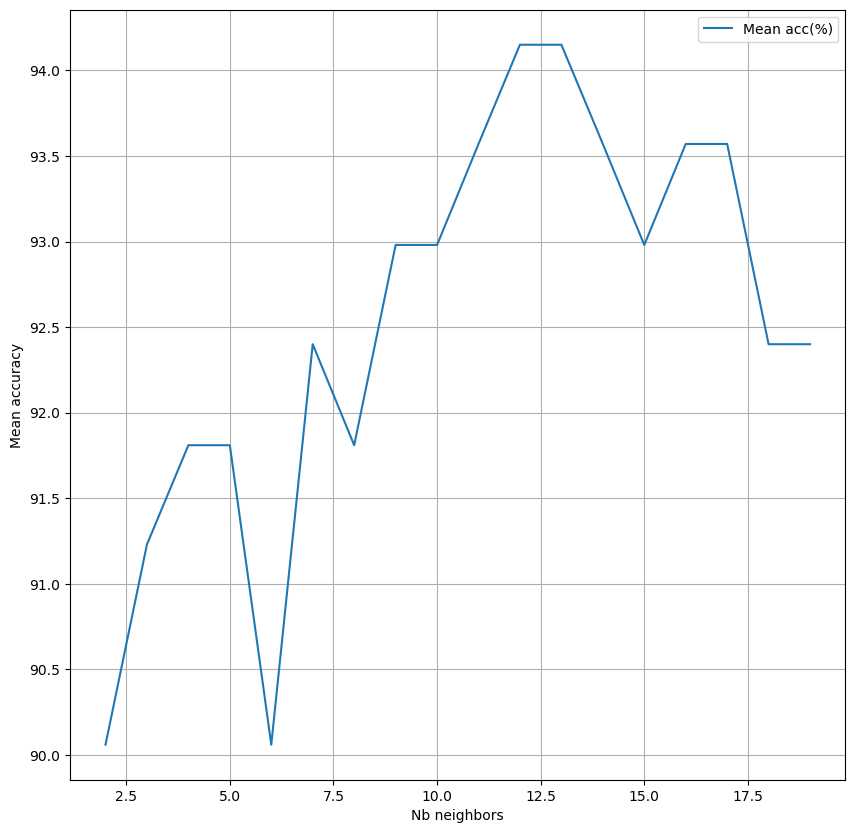

In [27]:
from collections import defaultdict
list_pct_test = list()
ddict_score = defaultdict()
pct_train_size = 0.7
target_name0 = 'benign'
target_name1 = 'malignant'

for nb in range(2,20) :
    knn = KNeighborsClassifier(n_neighbors=nb,p=2)
    _, pct_test = binary_training_and_testing(df_cancer, pct_train_size, knn, target_name0, target_name1)
    list_pct_test.append(pct_test)
    ddict_score[nb] = pct_test

df_score = pd.DataFrame(data=ddict_score.values(), columns=['Mean acc(%)'], index = ddict_score.keys())

ax=df_score.plot(figsize=(10,10), grid=True)
ax.set_xlabel('Nb neighbors')
_=ax.set_ylabel('Mean accuracy')

# <font color='blus'>Model complexity & dataset size

> **What's happen when the size of a dataset used to train an algorithm increases?**

> Lets get cancer dataset and check.
>
> In the statements below, samples sizes for training are increased from 3% to 100%.
>
> A training factor is fixed to 100 and training percentage is derived from it.

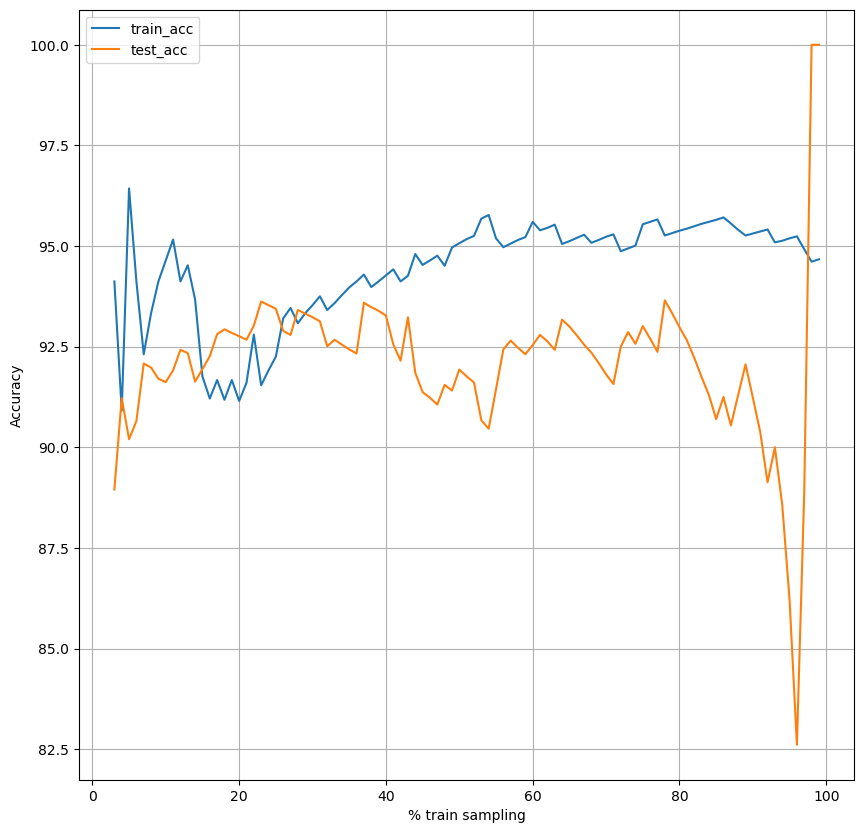

In [28]:
list_score_train = list()
list_score_test = list()

train_factor = 100
knn = KNeighborsClassifier(n_neighbors=5,p=2)

iter_sample_train = range(3, train_factor, 1)
for sample_train in  iter_sample_train:
    # Create percentage of training factor
    pct_train_size = sample_train/train_factor
    
    # Training KNN algorithm and scoring it
    score_train, score_test = binary_training_and_testing(df_cancer, pct_train_size, knn, target_name0, target_name1)
    
    # scores are recorded into a list
    list_score_train.append(score_train)
    list_score_test.append(score_test)
    
# Create plot dataframe from list of scores
df_train_acc = pd.DataFrame(data=list_score_train, columns=['train_acc'], index = [sample for sample in iter_sample_train])
df_test_acc  = pd.DataFrame(data=list_score_test,  columns=['test_acc'],  index = [sample for sample in iter_sample_train])
df_train_test_acc = pd.concat([df_train_acc, df_test_acc], axis=1)

# Use plot method from plot dataframe
ax=df_train_test_acc.plot(figsize=(10,10), grid=True)
ax.set_xlabel('% train sampling')
_=ax.set_ylabel('Accuracy')

> When size of training dataset increases then algorithm overfit.

## <font color='blus'>A model is simple, real world is complex

>
> Have in mind that a data model is, at first, a model, meaning that it represents an abstraction of a real thing, a simplification of a real thing. 
>
> When more and more observations are added into the model, then, the data model is more and more close from the real world it represents. This claim is true at the condition that each added new data brings a "piece" of **information** that brings it closers to the real thing.
>
> Then the more data are added into a dataset, the more the model is closed from a real thing, the more it becomes fare from the simplification and then, the more it becomes complex.
>
> If the algorithm is complex enough, then it will have the ability to capture 

## <font color='blus'>Why to measure the complexity of an algorithm ?

> Measuring complexity of an algorihtm lead to master complex mathematics theories based of statistics, such as `Rademacher` or `Vapnik&Chervonenkis` ones. 
> 
> These theories are based on kind of statistical errors mathematicians face when they want to optimize a statistical learning algorithm.  They are: 
> - empirical error, error issued from a training dataset; this error is biaised because the algorithm knows only data from training dataset
> - generalisation error, error issued from unseen data
>
> Roughly said, the measurement of an algorithm complexity is related to its ability to extract information from a dataset. And this value is an upper bound of the generalization error that is statiscaly always greater then empiric error.
>
> This means that while controling the complexity of an algorihtm by its measurement, it becomes possible to control the generalisation error.

## <font color='blus'>How to measure the complexity of an algorithm ?

> Suppose that there is a linear relationship between $X=(X_0,...,X_N)$ predictives variables from a dataset and the target to predict, $Y$. 
>
> Then such relationship can be expressed as : 
> - $Y_{pred} = a_0\times X_O + a_1\times X_1 + ... + a_N\times X_N + \beta$
>
> Once trained, algorihtm has learned an approximation of the $N+1$ coefficients $a_0, ..., a_N, \beta$
>
> But may be, some dimensions from this dataset, mean, values from one or some of the columns $X_i$ do not play a significant rôle in representing a real thing. For example, the thick of a paint that covers a large area is not significant considering other plan dimensions.
>
> Then a linear algorithm that has learned an approximation of only $N$ coefficents will also do a good job! It is able to extract information from dataset with less coefficients. Then its complexity may be approximate as the number of estimated coefficients.

# <font color='blus'>Data exploration

## <font color='blus'>Univariate exploration

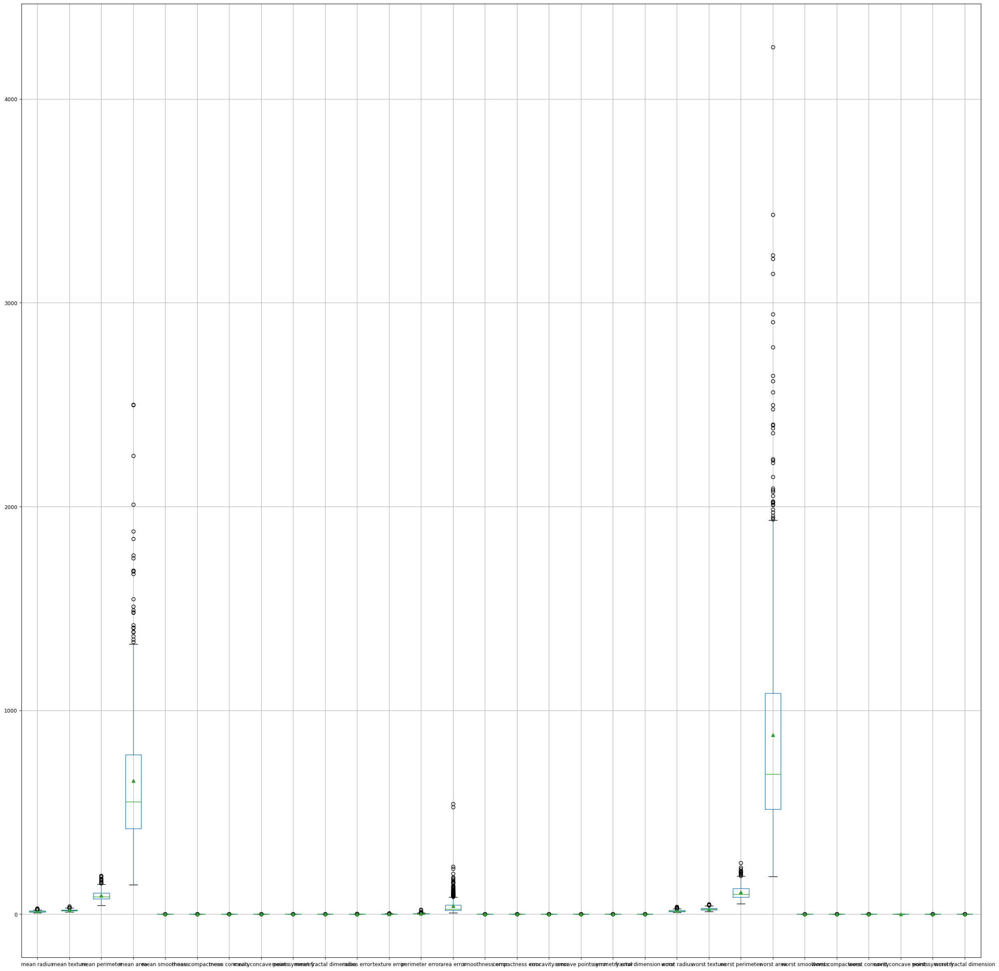

In [29]:
ax = df_cancer.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

> This diagram shows that scales are very different from one feature from another. 
>
> Each feature expresses a specific characteristic for an observation.
>
> Magnitude of mean values change from the unit to 100. Comparing 2 values with such different scales leads to under-estimate effects of the statistics of one or more variables (mean, standard deviation...) in the statistical learning process.
>
> **Information** related to this under-estimated characteristics can not be easily extracted from dataset by algorithm leading to a bias in the model representation.
>
> This plot shows **outliers**. Outliers have negative effects on some algorithms, such as linear algorithms. 

> The `describe` method from dataframe provides statistics (central values) from each feature into dataframe

In [30]:
df_cancer.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


> Lest's focuse on standard deviation

In [31]:
df_cancer.describe().loc['std']

mean radius                  3.524049
mean texture                 4.301036
mean perimeter              24.298981
mean area                  351.914129
mean smoothness              0.014064
mean compactness             0.052813
mean concavity               0.079720
mean concave points          0.038803
mean symmetry                0.027414
mean fractal dimension       0.007060
radius error                 0.277313
texture error                0.551648
perimeter error              2.021855
area error                  45.491006
smoothness error             0.003003
compactness error            0.017908
concavity error              0.030186
concave points error         0.006170
symmetry error               0.008266
fractal dimension error      0.002646
worst radius                 4.833242
worst texture                6.146258
worst perimeter             33.602542
worst area                 569.356993
worst smoothness             0.022832
worst compactness            0.157336
worst concav

> Let's filter features with standard deviation less then 1
>
> This create a pandas Series, `ser_filter_std` where indexes are `df_cancer` column names.

In [32]:
ser_filter_std = df_cancer.std(numeric_only=True) == df_cancer.std(numeric_only=True).min()
ser_filter_std.sample(3)

symmetry error             False
worst texture              False
fractal dimension error     True
dtype: bool

> Columns with standar deviation compliant with filter are extracted from pandas `Series`

In [33]:
list_col_std = [column for column in ser_filter_std.index if ser_filter_std.loc[column] == np.True_]
df_cancer_filtered = df_cancer[list_col_std].copy(deep=True)
print(df_cancer_filtered.shape)

(569, 1)


> Display

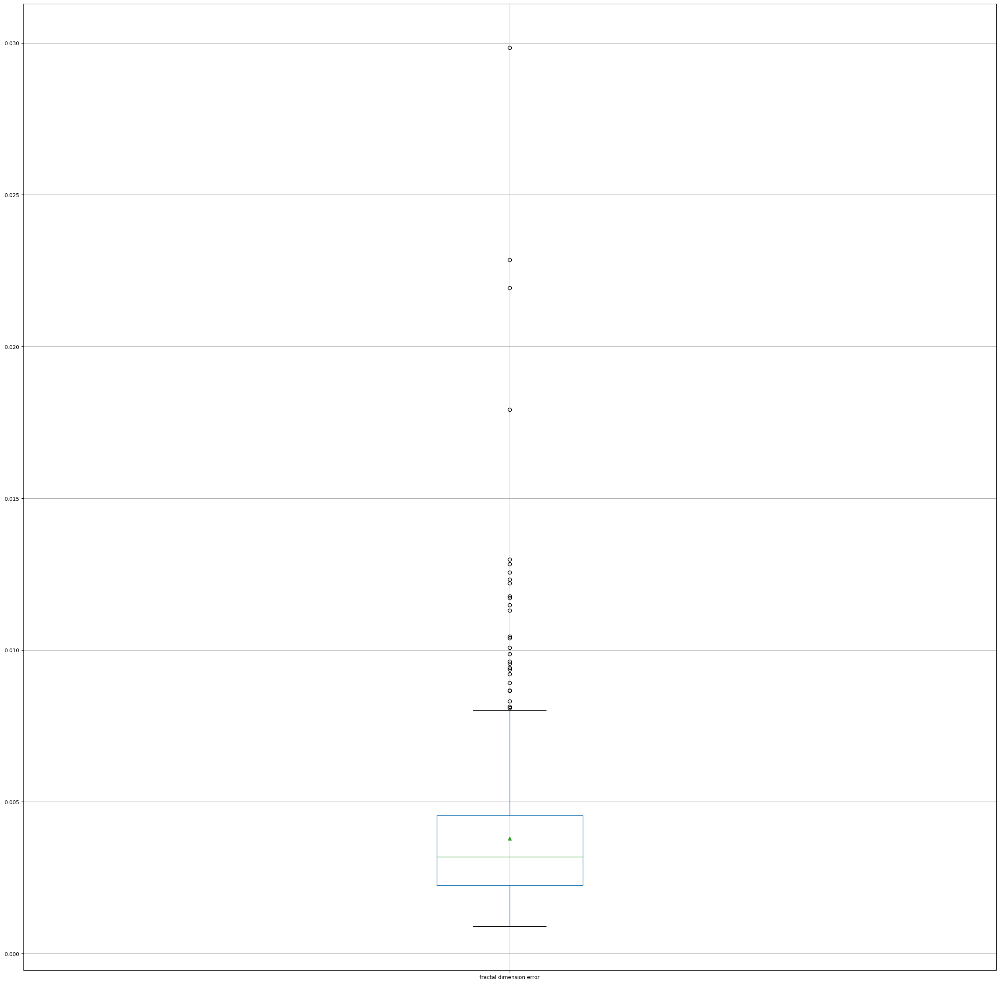

In [34]:
ax = df_cancer_filtered.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

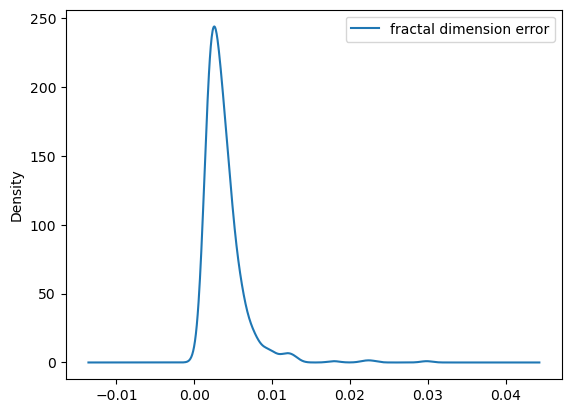

In [35]:
_ = df_cancer_filtered.plot(kind='density')

> ALgorithm is scored with these filtered features

In [36]:
df_cancer_filtered['target'] = df_cancer['target']

knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_cancer_filtered, pct_train_size, classifier, target_name0, target_name1)
print(pct_train, pct_test)

74.37 57.89


> Let's get feature with max standard deviation 
>
> This create a pandas Series, `ser_filter_std` where indexes are `df_cancer` column names.

In [37]:
ser_filter_std = df_cancer.std(numeric_only=True) == df_cancer.std(numeric_only=True).max()
ser_filter_std.sample(3)

worst area                  True
mean concavity             False
fractal dimension error    False
dtype: bool

> Columns with standar deviation compliant with filter are extracted from pandas `Series`

In [38]:
list_col_std = [column for column in ser_filter_std.index if ser_filter_std.loc[column] == np.True_]
df_cancer_filtered = df_cancer[list_col_std].copy(deep=True)
print(df_cancer_filtered.shape)

(569, 1)


> Display

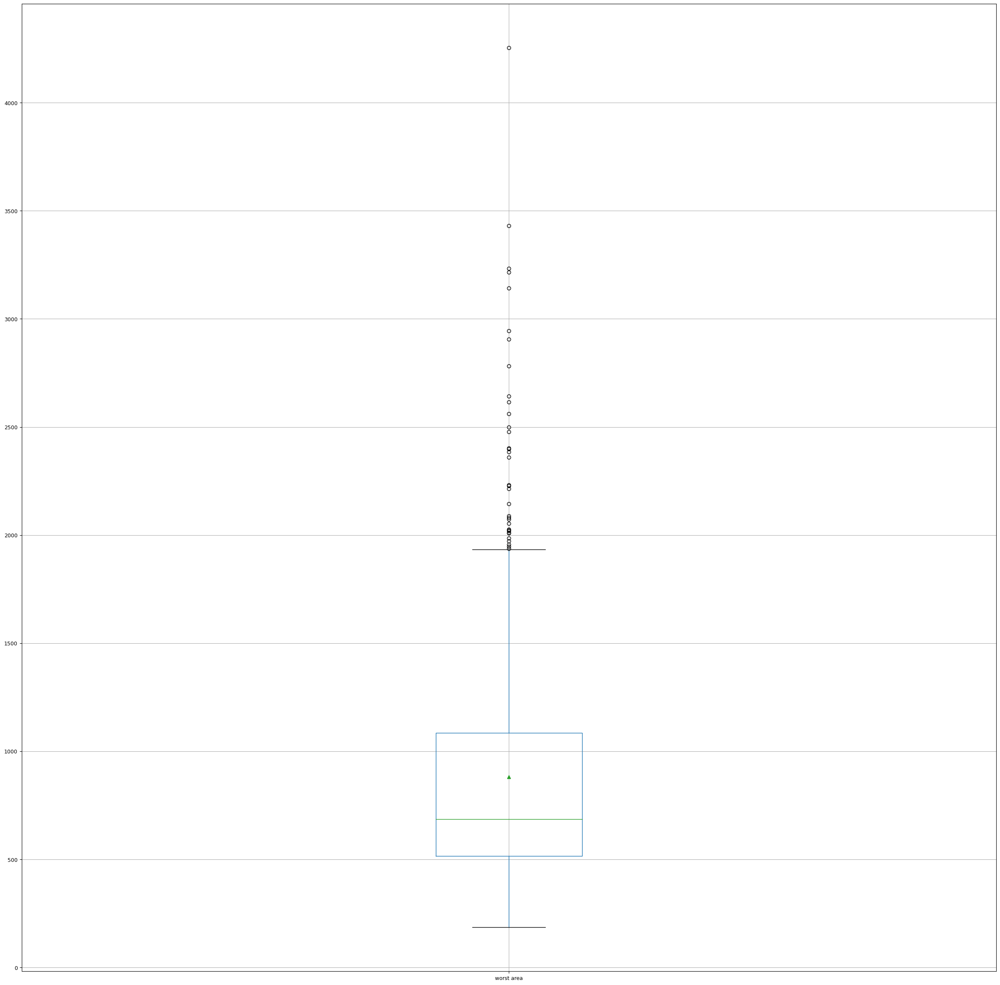

In [39]:
ax = df_cancer_filtered.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

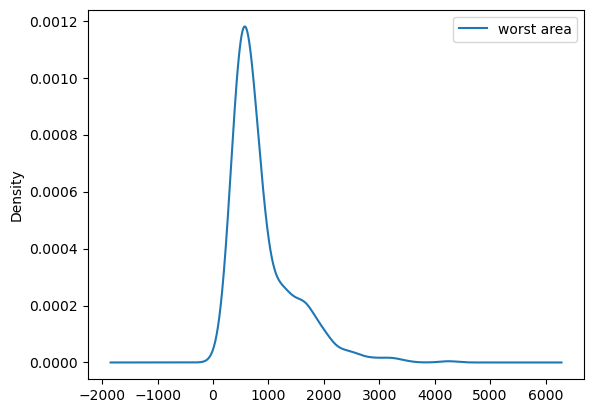

In [40]:
_ = df_cancer_filtered.plot(kind='density')

> Scoring algorithm with new data model

In [41]:
df_cancer_filtered['target'] = df_cancer['target']

knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_cancer_filtered, pct_train_size, classifier, target_name0, target_name1)
print(pct_train, pct_test)

92.46 91.81


> **Greater the variability is better is the algorithm score**
>
> Algorithm score depends on the information it has ability to extract from dataset.
>
> More information is extracted, more algorithm is able to approximate targeted match function.
>
> When datamodel hold enough information then it will be possible to find appropriate algorithm to fit the targeted match function.

> From our experiments we got followings results :
> - 1 feature min std : 74.37 57.89
> - 1 feature max std : 92.46 91.81
> - all features      : 95.23 91.81

In [42]:
dict_result = { '1 feature min std train' : 74.37
               ,'1 feature min std test' : 57.89
               ,'1 feature max std train' : 92.46
               ,'1 feature max std test' :91.81
               ,'all features train'      : 95.23
               ,'all features test' : 91.81}

pd.DataFrame(data=dict_result.values(), columns=['Score'], index =dict_result.keys() ).T

,1 feature min std train,1 feature min std test,1 feature max std train,1 feature max std test,all features train,all features test
Score,74.37,57.89,92.46,91.81,95.23,91.81


> The score with max feature standard deviation is better then the one with min standard deviation but less then the one with all features.

## <font color='blus'>Scaling dataset

> Scaling are transformations aims to make all variables comparable by harmonizing their scale.
>
> Different scale come from the fact features are expressed with different units and represent different aspects of a data model.
>
> Large value may skew the match target function that algorithm i strained to learn, because the influence of these variables can be important due to their high value and without real other reason to behave so. Such influence can be regarded as a bias of the real world! 
>
> This is the case with algorithms that compute distances, such as KNN.
>
> Also linear algorithm, that are a linear combination of weighted features, as we will see in the next sections, are sensitive to such differences, between low and large values.
>
> Scaling is a way to harmonize features from a model. Scaling transformations are supposed to increase performances of some models.
>

### <font color='blus'>Min-max scaler transformation

> Such transformations is said normalization. It should take place when distributions are not normal distributions.
>
> It is recommanded to apply such transformation when diffenrece between values are large. Statistics such as mean provide insight about such difference.

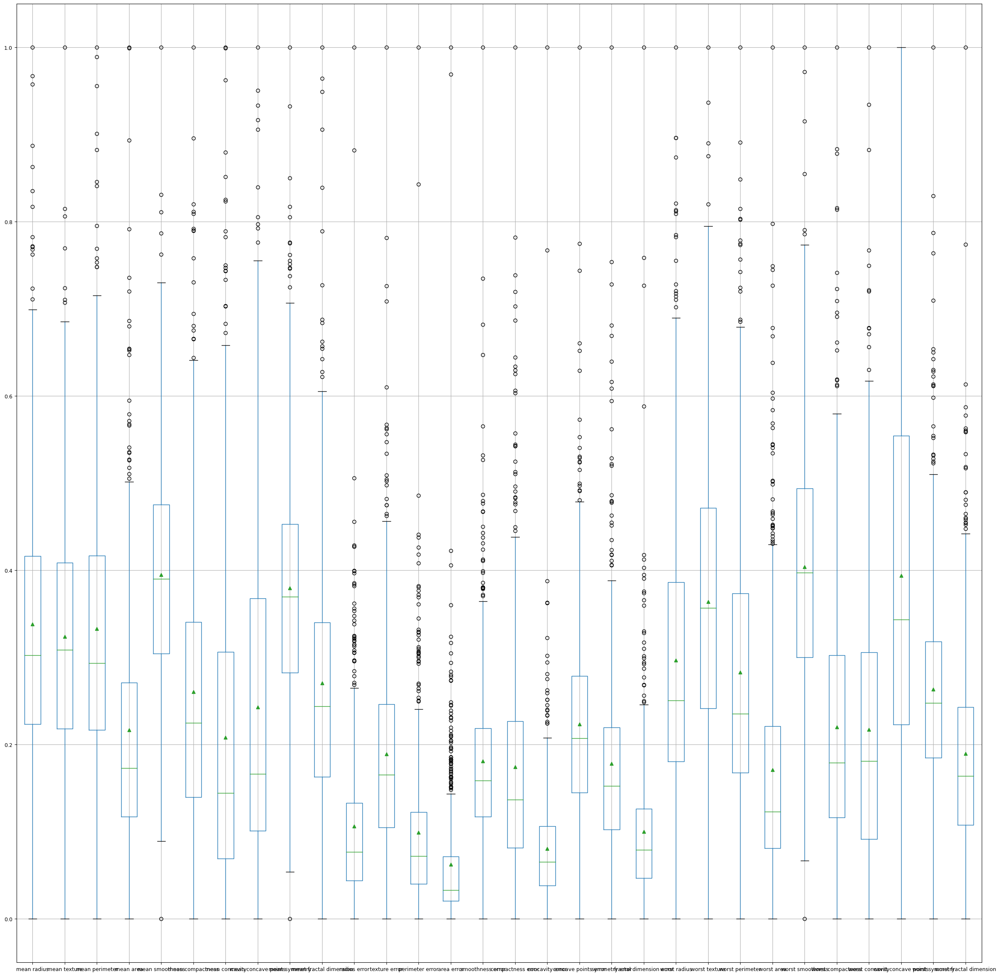

In [43]:
from sklearn.preprocessing import MinMaxScaler
trans = MinMaxScaler()
X,y = get_X_y(df_cancer)
X_trans = trans.fit_transform(X)
df_X_trans = pd.DataFrame(data=X_trans, columns = df_cancer.columns[:-1])
ax = df_X_trans.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

In [44]:
df_X_trans.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.338222,0.323965,0.332935,0.216920,0.394785,0.260601,0.208058,0.243137,0.379605,0.270379,...,0.296663,0.363998,0.283138,0.170906,0.404138,0.220212,0.217403,0.393836,0.263307,0.189596
std,0.166787,0.145453,0.167915,0.149274,0.126967,0.161992,0.186785,0.192857,0.138456,0.148702,...,0.171940,0.163813,0.167352,0.139932,0.150779,0.152649,0.166633,0.225884,0.121954,0.118466
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.223342,0.218465,0.216847,0.117413,0.304595,0.139685,0.069260,0.100944,0.282323,0.163016,...,0.180719,0.241471,0.167837,0.081130,0.300007,0.116337,0.091454,0.223127,0.185098,0.107700
50%,0.302381,0.308759,0.293345,0.172895,0.390358,0.224679,0.144189,0.166501,0.369697,0.243892,...,0.250445,0.356876,0.235320,0.123206,0.397081,0.179110,0.181070,0.343402,0.247782,0.163977
75%,0.416442,0.408860,0.416765,0.271135,0.475490,0.340531,0.306232,0.367793,0.453030,0.340354,...,0.386339,0.471748,0.373475,0.220901,0.494156,0.302520,0.305831,0.554639,0.318155,0.242949
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


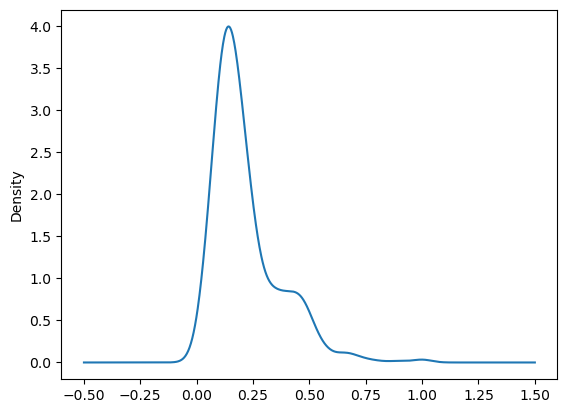

In [45]:
_ = df_X_trans['mean area'].plot(kind='density')

> For calling `binary_training_and_testing` the target column is added to the transformed dataframe.

In [46]:
df_X_trans['target'] = df_cancer['target']

knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.6
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_X_trans, pct_train_size, classifier, target_name0, target_name1)
print(pct_train, pct_test)

97.95 96.93


In [47]:
dict_result = { '1 feature min std train' : 74.37
               ,'1 feature min std test' : 57.89
               ,'1 feature max std train' : 92.46
               ,'1 feature max std test' :91.81
               ,'all train'      : 95.23
               ,'all test' : 91.81
               ,'all robust train'      : 97.24
               ,'all robust test' : 96.49
               ,'all min-max train'      : 97.95
               ,'all min-max test' : 96.93
              
              }

pd.DataFrame(data=dict_result.values(), columns=['Score'], index =dict_result.keys() ).T

,1 feature min std train,1 feature min std test,1 feature max std train,1 feature max std test,all train,all test,all robust train,all robust test,all min-max train,all min-max test
Score,74.37,57.89,92.46,91.81,95.23,91.81,97.24,96.49,97.95,96.93


### <font color='blus'>Standard scaler transformation

> Standardization transform value that may be negative or positive. It leads to a mean value close to 0 (centered arond zero) and a standard deviation close to 1, given a standard-normalized distribition.
>
> Such scaling may be expected when distributions are close to Gaussian distributions.

In [48]:
from sklearn.preprocessing import StandardScaler

In [49]:
trans = StandardScaler()
X,y = get_X_y(df_cancer)
X_trans = trans.fit_transform(X)
df_X_trans = pd.DataFrame(data=X_trans, columns = df_cancer.columns[:-1])

In [50]:
df_X_trans.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,...,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,-3.162867e-15,-6.530609e-15,-7.078891e-16,-8.799835e-16,6.132177e-15,-1.120369e-15,-4.421380e-16,9.732500e-16,-1.971670e-15,-1.453631e-15,...,-2.333224e-15,1.763674e-15,-1.198026e-15,5.049661e-16,-5.213170e-15,-2.174788e-15,6.856456e-16,-1.412656e-16,-2.289567e-15,2.575171e-15
std,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,...,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00
min,-2.029648e+00,-2.229249e+00,-1.984504e+00,-1.454443e+00,-3.112085e+00,-1.610136e+00,-1.114873e+00,-1.261820e+00,-2.744117e+00,-1.819865e+00,...,-1.726901e+00,-2.223994e+00,-1.693361e+00,-1.222423e+00,-2.682695e+00,-1.443878e+00,-1.305831e+00,-1.745063e+00,-2.160960e+00,-1.601839e+00
25%,-6.893853e-01,-7.259631e-01,-6.919555e-01,-6.671955e-01,-7.109628e-01,-7.470860e-01,-7.437479e-01,-7.379438e-01,-7.032397e-01,-7.226392e-01,...,-6.749213e-01,-7.486293e-01,-6.895783e-01,-6.421359e-01,-6.912304e-01,-6.810833e-01,-7.565142e-01,-7.563999e-01,-6.418637e-01,-6.919118e-01
50%,-2.150816e-01,-1.046362e-01,-2.359800e-01,-2.951869e-01,-3.489108e-02,-2.219405e-01,-3.422399e-01,-3.977212e-01,-7.162650e-02,-1.782793e-01,...,-2.690395e-01,-4.351564e-02,-2.859802e-01,-3.411812e-01,-4.684277e-02,-2.695009e-01,-2.182321e-01,-2.234689e-01,-1.274095e-01,-2.164441e-01
75%,4.693926e-01,5.841756e-01,4.996769e-01,3.635073e-01,6.361990e-01,4.938569e-01,5.260619e-01,6.469351e-01,5.307792e-01,4.709834e-01,...,5.220158e-01,6.583411e-01,5.402790e-01,3.575891e-01,5.975448e-01,5.396688e-01,5.311411e-01,7.125100e-01,4.501382e-01,4.507624e-01
max,3.971288e+00,4.651889e+00,3.976130e+00,5.250529e+00,4.770911e+00,4.568425e+00,4.243589e+00,3.927930e+00,4.484751e+00,4.910919e+00,...,4.094189e+00,3.885905e+00,4.287337e+00,5.930172e+00,3.955374e+00,5.112877e+00,4.700669e+00,2.685877e+00,6.046041e+00,6.846856e+00


> Standard deviation for transformed variables is reduced to 1, whatever the original variable.
>
> There is no more size effect between variables and the capacity for each variable to deliver information is related to its intrinsec variability only.

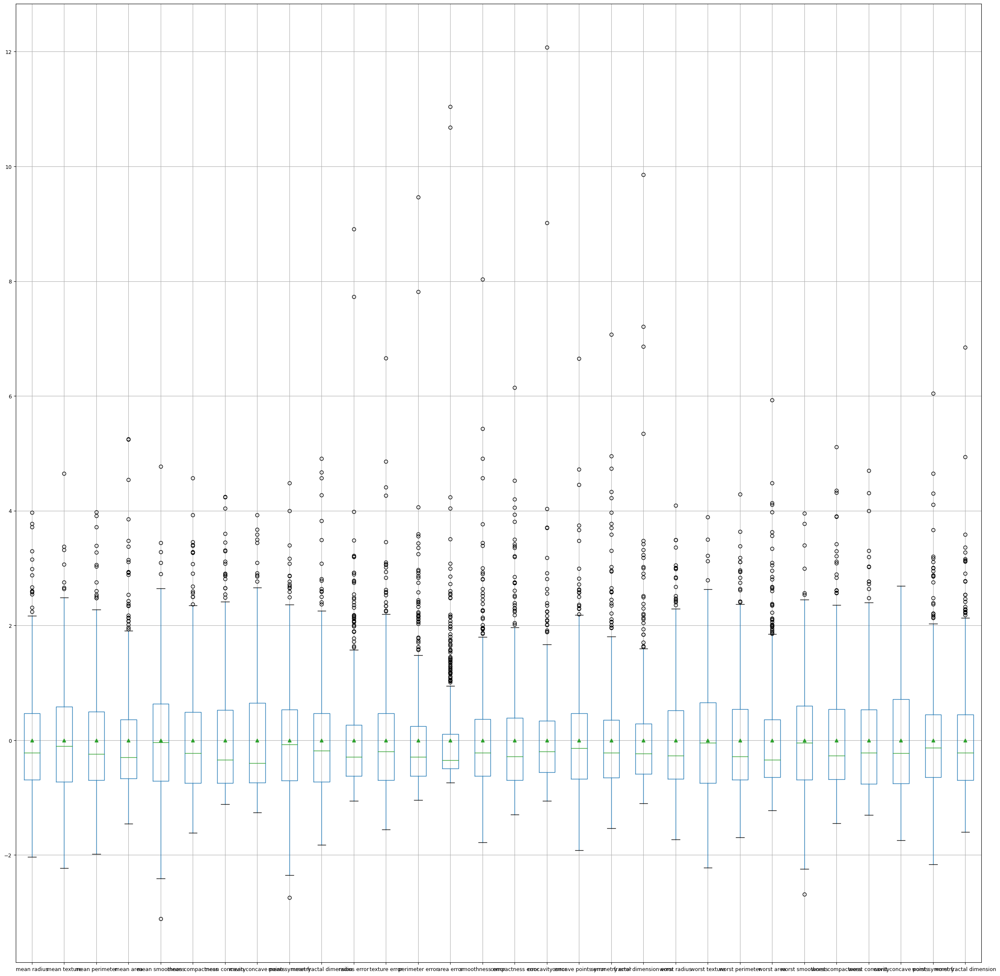

In [51]:
ax = df_X_trans.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

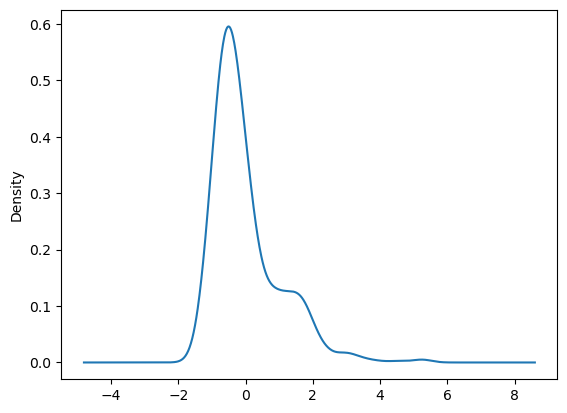

In [52]:
_ = df_X_trans['mean area'].plot(kind='density')

In [53]:
df_X_trans['target'] = df_cancer['target']
classifier = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_X_trans
                                                  , pct_train_size
                                                  , classifier
                                                  , target_name0
                                                  , target_name1)
print(pct_train, pct_test)

97.74 95.91


### <font color='blus'>Robust scaler transformation

> This transformation allows to avoid effect of outliers.
>
> Outliers are observations with low probability to appear.
>
> This transformation is expressed as : $val_{scal} = \frac{val - median}{p_{75} - p_{25}}$ where :
>> - $p_{25}$ is the 25th percentile
>> - $p_{75}$ is the 75th percentile
>
> The transformed variable is supposed to be no more skewed by outliers and outliers are still present.

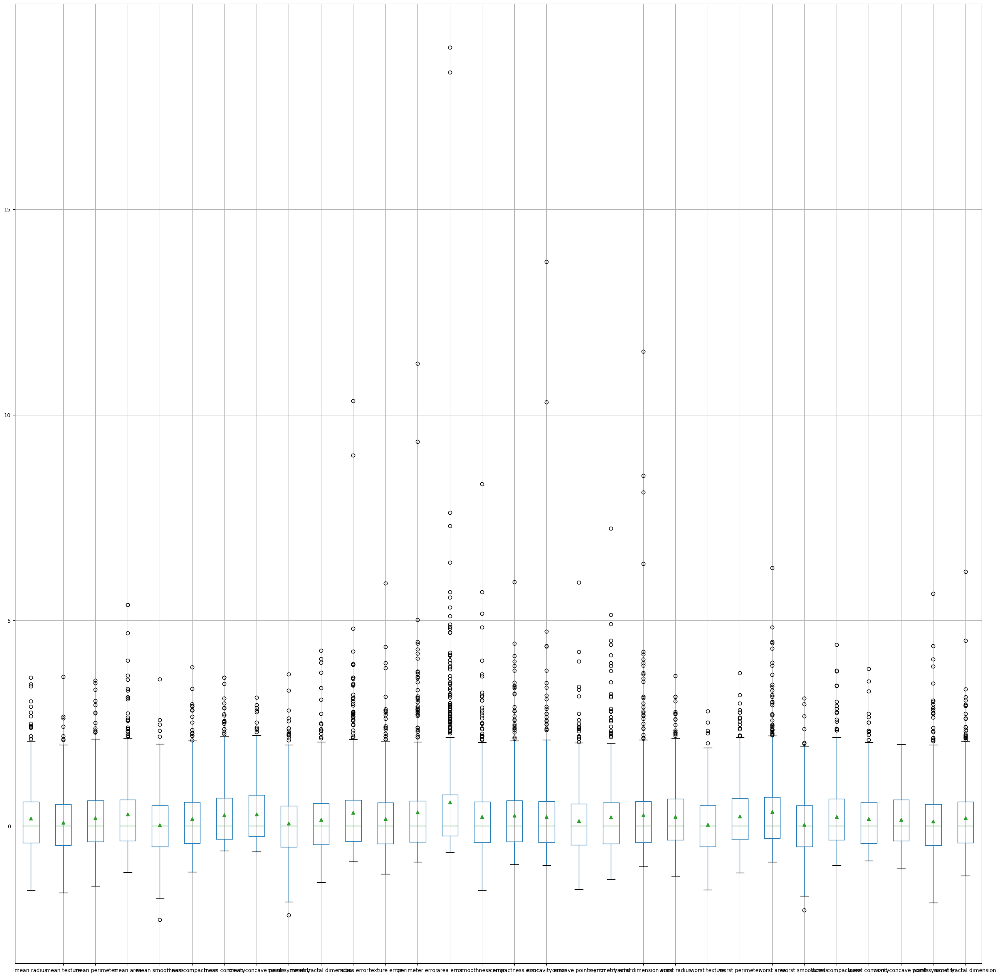

In [54]:
from sklearn.preprocessing import RobustScaler
trans = RobustScaler()
X,y = get_X_y(df_cancer)
X_trans = trans.fit_transform(X)
df_X_trans = pd.DataFrame(data=X_trans, columns = df_cancer.columns[:-1])
ax = df_X_trans.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

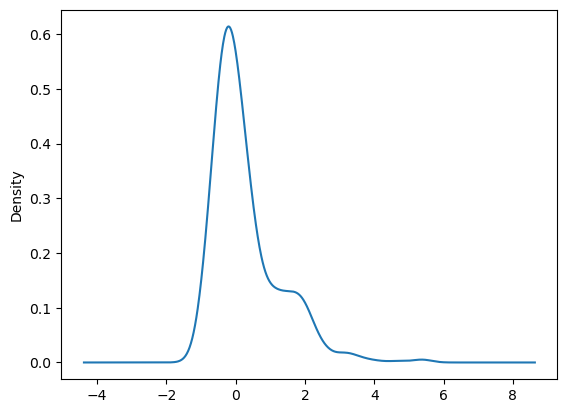

In [55]:
_ = df_X_trans['mean area'].plot(kind='density')

In [56]:
df_X_trans['target'] = df_cancer['target']
classifier = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_X_trans
                                                  , pct_train_size
                                                  , classifier
                                                  , target_name0
                                                  , target_name1)
print(pct_train, pct_test)

97.24 95.32


In [57]:
dict_result = { '1 feature min std train' : 74.37
               ,'1 feature min std test' : 57.89
               ,'1 feature max std train' : 92.46
               ,'1 feature max std test' :91.81
               ,'all train'      : 95.23
               ,'all test' : 91.81
               ,'all robust train'      : 97.24
               ,'all robust test' : 96.49
              
              }

pd.DataFrame(data=dict_result.values(), columns=['Score'], index =dict_result.keys() ).T

,1 feature min std train,1 feature min std test,1 feature max std train,1 feature max std test,all train,all test,all robust train,all robust test
Score,74.37,57.89,92.46,91.81,95.23,91.81,97.24,96.49


In [58]:
dict_result = { '1 feature min std train' : 74.37
               ,'1 feature min std test' : 57.89
               ,'1 feature max std train' : 92.46
               ,'1 feature max std test' :91.81
               ,'all train'      : 95.23
               ,'all test' : 91.81
               ,'all robust train'      : 97.24
               ,'all robust test' : 96.49
               ,'all min-max train'      : 97.95
               ,'all min-max test' : 96.93
               ,'all std-scal train'      : 97.74
               ,'all std-scal test' : 95.91
              
              }

pd.DataFrame(data=dict_result.values(), columns=['Score'], index =dict_result.keys() ).T

,1 feature min std train,1 feature min std test,1 feature max std train,1 feature max std test,all train,all test,all robust train,all robust test,all min-max train,all min-max test,all std-scal train,all std-scal test
Score,74.37,57.89,92.46,91.81,95.23,91.81,97.24,96.49,97.95,96.93,97.74,95.91


### Conclusions

> An algorithm based on distances computation, such as KNN, is sensitive to scales effects. 
>
> The fact that min-max scaler provide better performances then standard scaler may be due to the fact distribution are not closed to Gaussian distributions.
>
> Feature variability is related to quantity of information this feature may deliver
>
> Adding features provide better scoring; new features add information that allow the algorithm to provide better score
>
> Features transformation such as rescaling allow to increase algorithm score without adding extra information into data-model  

## <font color='blus'>Multivariate exploration

### <font color='blus'>Correlations

In [59]:
df_cancer.corr()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
mean radius,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
mean texture,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
mean perimeter,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
mean area,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
mean smoothness,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
mean compactness,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
mean concavity,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
mean concave points,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
mean symmetry,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413
mean fractal dimension,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.253691,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297


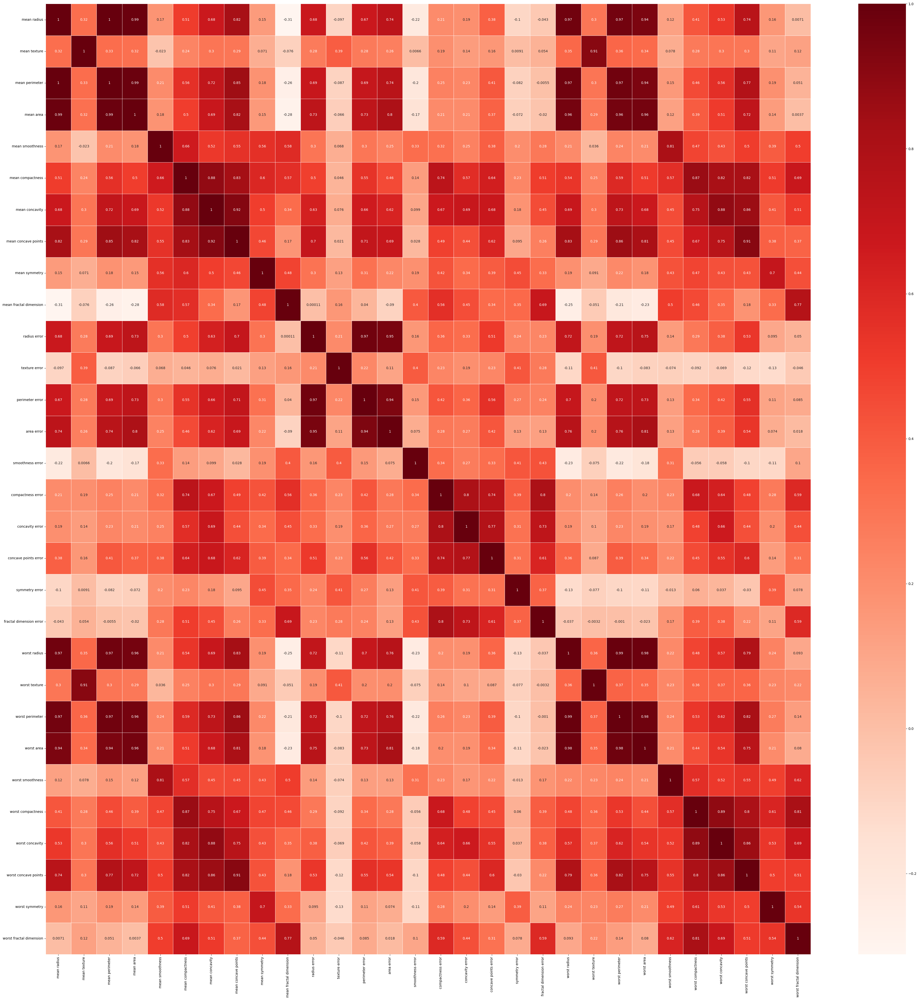

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(50,50)) 
df_corr = df_cancer.corr()
ax = sns.heatmap(df_corr, cmap="Reds", annot=True, linewidths=.5, ax=ax)

In [61]:
df_filter = np.abs(df_corr)>=0.6

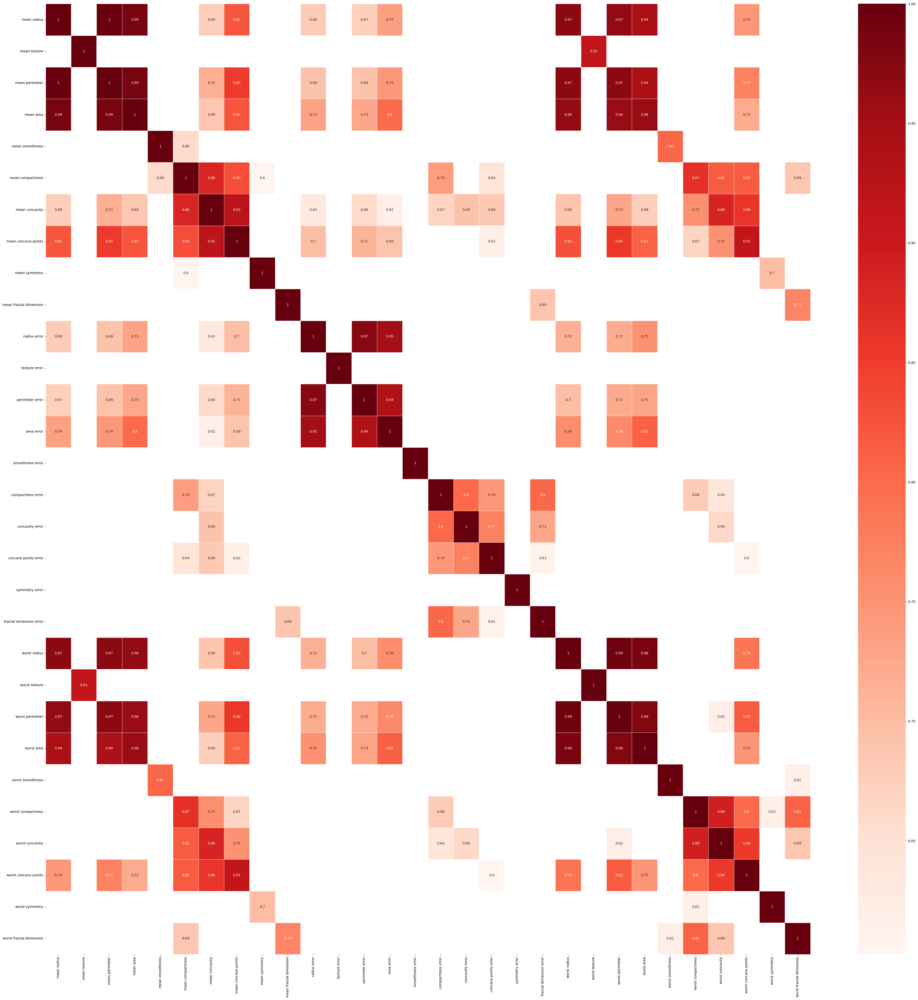

In [62]:
df_filter = np.abs(df_corr)>=0.6
fig, ax = plt.subplots(figsize=(50,50)) 
#df_corr = df_cancer.corr()
ax = sns.heatmap(df_corr[df_filter], cmap="Reds", annot=True, linewidths=.5, ax=ax)

> The upper triangle of correlation matrix is selected
>
> - k is the diagonal to keep and it is counted from the main diagonal

In [63]:
df_upper = df_corr.where(np.triu(np.ones(df_corr.values.shape), k=1).astype(np.bool))

/var/folders/3c/hjtyk_rn3jg_lml1bd3q8fbc0000gn/T/ipykernel_739/1073219314.py:1: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df_upper = df_corr.where(np.triu(np.ones(df_corr.values.shape), k=1).astype(np.bool))


In [64]:
df_upper.head(5)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
mean radius,NaN,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
mean texture,NaN,NaN,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
mean perimeter,NaN,NaN,NaN,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
mean area,NaN,NaN,NaN,NaN,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
mean smoothness,NaN,NaN,NaN,NaN,NaN,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316


> Remove column where any value is greater then a threshold
> - List of columns to drop is built: `list_col_to_drop`
> - Columns to keep are filtered from list column to drop: `list_col_filtered`

In [65]:
THRESHOLD = 0.8
list_col_to_drop = [column for column in df_upper.columns if any(df_upper[column] > THRESHOLD)]
list_col_filtered = [col for col in df_cancer.columns if col not in list_col_to_drop]

print("Dimension= {}".format(len(list_col_filtered)))

Dimension= 14


In [66]:
knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_X_trans[list_col_filtered]
                                                  , pct_train_size
                                                  , classifier
                                                  , target_name0
                                                  , target_name1)
print(pct_train, pct_test)

95.23 92.98


In [67]:
df_cancer['target'].unique()

array(['malignant', 'benign'], dtype=object)

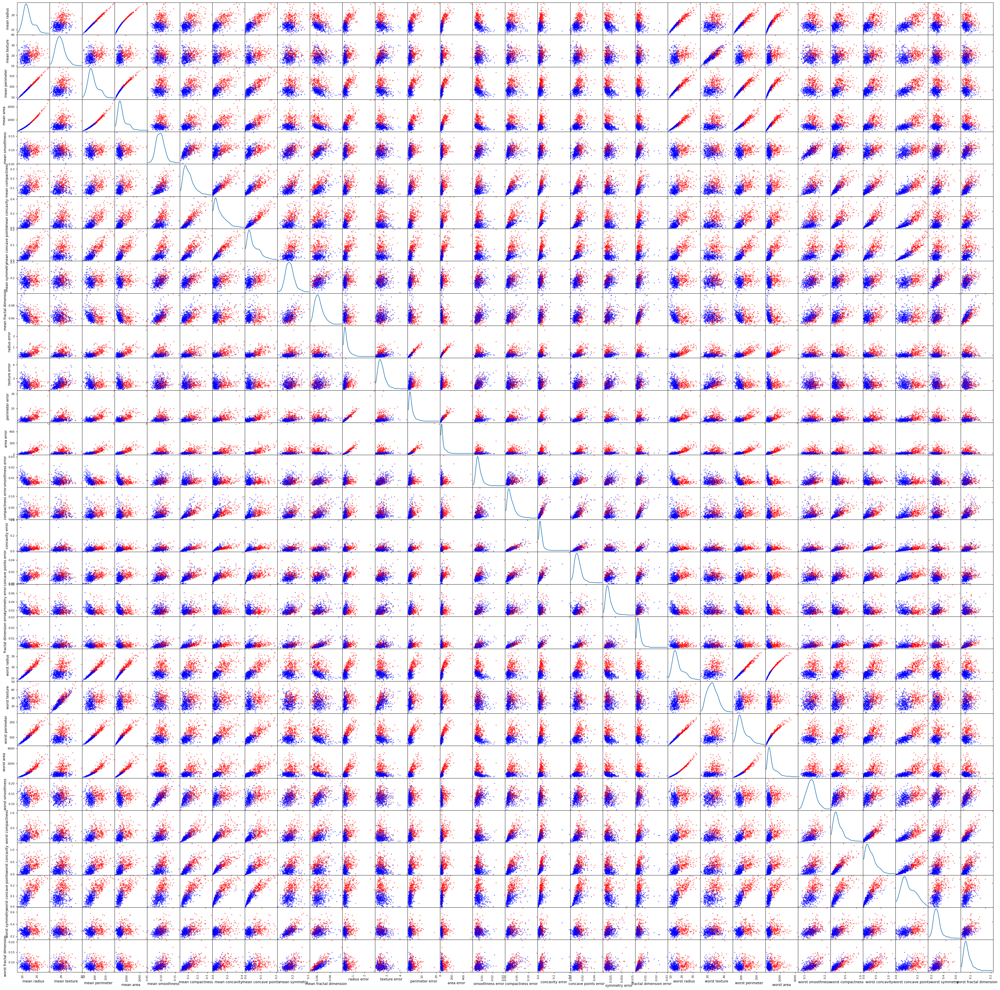

In [68]:
dict_color = {'malignant':'red', 'benign':'blue'}
list_palet = [dict_color[k] for k in df_cancer['target']]

from pandas.plotting import scatter_matrix
_ = scatter_matrix(df_cancer, figsize=(50,50), diagonal='kde', color=list_palet)

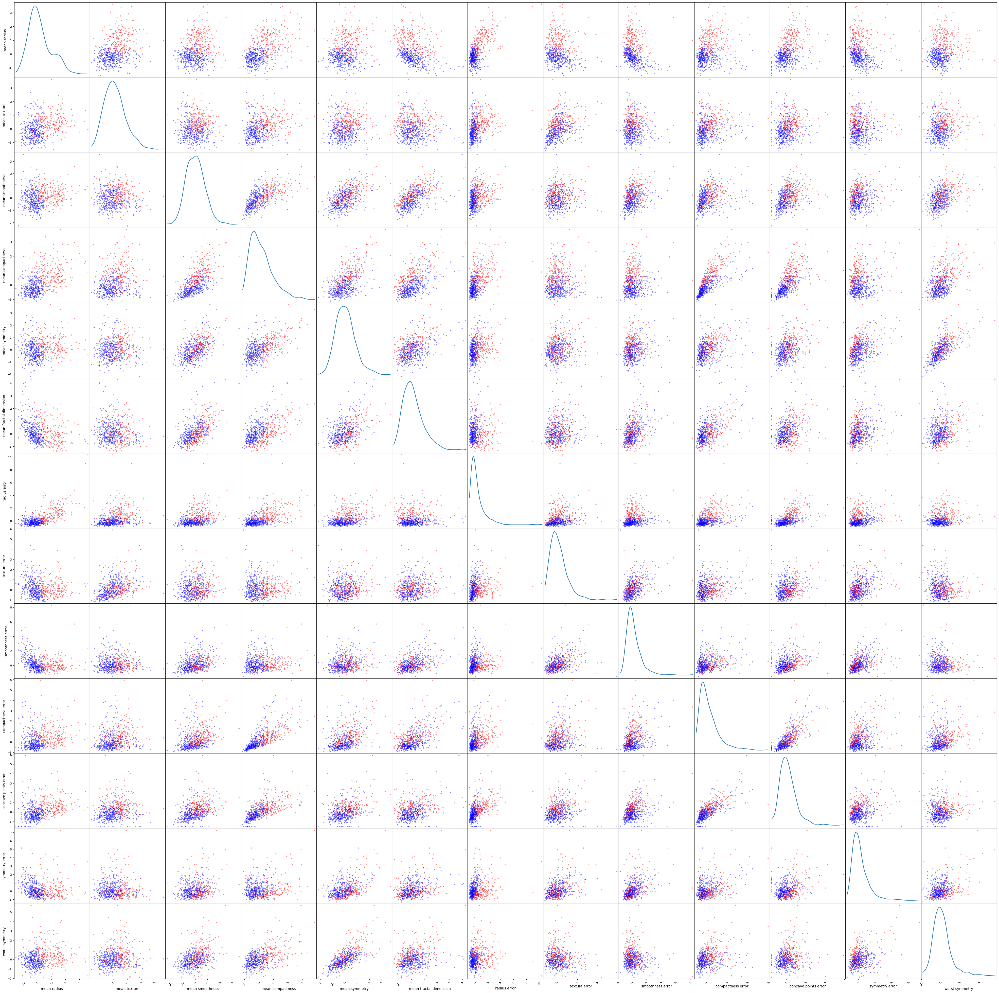

In [69]:
dict_color = {'malignant':'red', 'benign':'blue'}
list_palet = [dict_color[k] for k in df_X_trans[list_col_filtered]['target']]

from pandas.plotting import scatter_matrix
_ = scatter_matrix(df_X_trans[list_col_filtered], figsize=(50,50), diagonal='kde', color=list_palet)

> In the example below, different number of features are tested with transformed features and with no transformation.

> With 2 features `mean area`,`mean radius` and no transformation

> With 2 features `mean area`,`mean radius` and scaling transformation

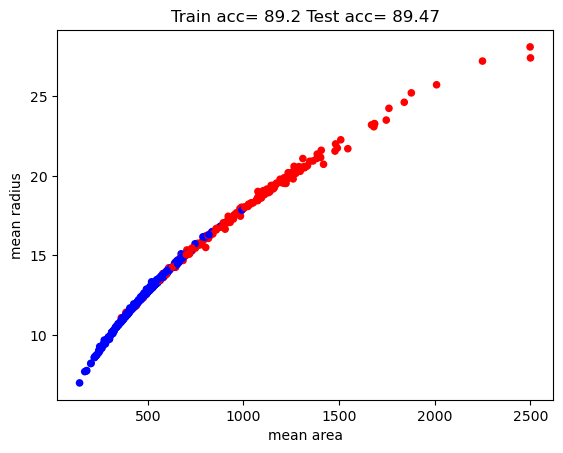

In [70]:
feature_x = 'mean area'
feature_y = 'mean radius'

df_cancer_reduced = df_cancer[[feature_x,feature_y,'target']]
dict_color = {'malignant':'red', 'benign':'blue'}
list_palet = [dict_color[k] for k in df_cancer_reduced['target']]
ax=df_cancer_reduced.plot(x=feature_x, y=feature_y, kind='scatter', c=list_palet)

knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_cancer_reduced
                                                  , pct_train_size
                                                  , classifier
                                                  , target_name0
                                                  , target_name1)
_=ax.set_title("Train acc= {} Test acc= {}".format(pct_train, pct_test))

> With 1 single feature `mean area` no scaling transformation

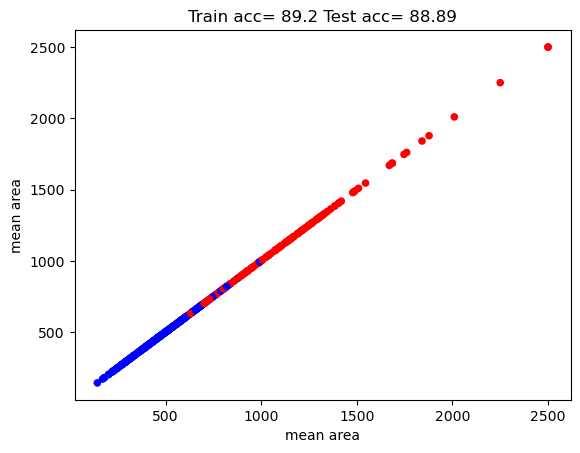

In [71]:
feature_x = 'mean area'
feature_y = feature_x

df_cancer_reduced = df_cancer[[feature_x,'target']]
dict_color = {'malignant':'red', 'benign':'blue'}
list_palet = [dict_color[k] for k in df_cancer_reduced['target']]
y  = [15]*len(df_cancer_reduced)
ax =df_cancer_reduced.plot(x=feature_x, y=feature_y, kind='scatter', c=list_palet)


knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_cancer_reduced
                                                  , pct_train_size
                                                  , classifier
                                                  , target_name0
                                                  , target_name1)

_=ax.set_title("Train acc= {} Test acc= {}".format(pct_train, pct_test))

> With 1 single feature `mean area` and scaling transformation

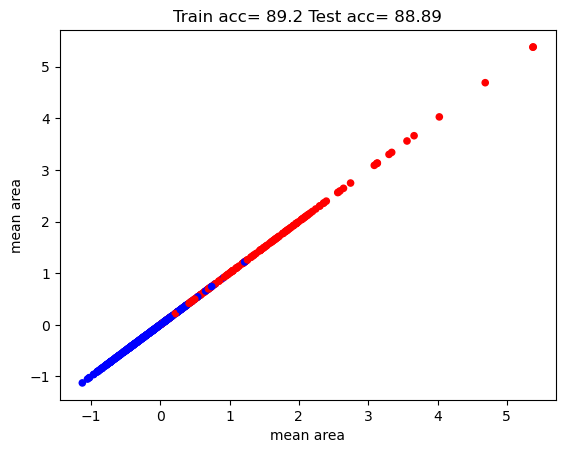

In [72]:
feature_x = 'mean area'
feature_y = feature_x

df_cancer_reduced = df_X_trans[[feature_x,'target']]
dict_color = {'malignant':'red', 'benign':'blue'}
list_palet = [dict_color[k] for k in df_cancer_reduced['target']]
y  = [15]*len(df_cancer_reduced)
ax =df_cancer_reduced.plot(x=feature_x, y=feature_y, kind='scatter', c=list_palet)


knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_cancer_reduced
                                                  , pct_train_size
                                                  , classifier
                                                  , target_name0
                                                  , target_name1)

_=ax.set_title("Train acc= {} Test acc= {}".format(pct_train, pct_test))

> Using a single dimension, scaling transformation has no effect over predictions, that what is understdandable.

> The results above shows that an additional feature, when correlated with the previous, does not enrich algorithm with significant information allowing to increase performances.
> - 1 feature : (Train acc, Test acc) = (91,22, 87,5)
> - 2 features: (Train acc, Test acc) = (91,22, 87,5)
>
> Then the trick is to select the best feature that delivers the best score

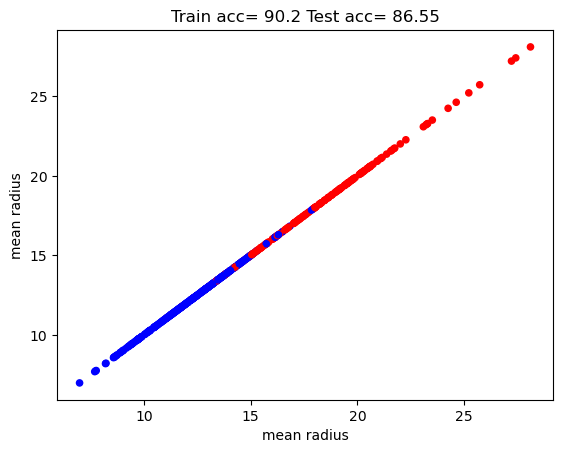

In [73]:
feature_x = 'mean radius'
feature_y = feature_x

df_cancer_reduced = df_cancer[[feature_x,'target']]
dict_color = {'malignant':'red', 'benign':'blue'}
list_palet = [dict_color[k] for k in df_cancer_reduced['target']]
y  = [15]*len(df_cancer_reduced)
ax=df_cancer_reduced.plot(x=feature_x, y=feature_y, kind='scatter', c=list_palet)

knn = KNeighborsClassifier(n_neighbors=5,p=2)
pct_train_size = 0.7
classifier = knn
target_name0 = 'benign'
target_name1 = 'malignant'

pct_train, pct_test = binary_training_and_testing(df_cancer_reduced
                                                  , pct_train_size
                                                  , classifier
                                                  , target_name0
                                                  , target_name1)
_=ax.set_title("Train acc= {} Test acc= {}".format(pct_train, pct_test))


> The results above shows that an additional feature, when correlated with the previous, does not enrich algorithm with significant information allowing to increase performances.
> - 1 feature : (Train acc, Test acc) = (91,22, 87,5)
> - 2 features: (Train acc, Test acc) = (91,22, 87,5)
> - 1 feature (mean radius): (Train acc, Test acc) = (91,89, 90,62)
>

# <font color='blus'>Regression

## <font color='blus'>Loading data

In [74]:
import sklearn.datasets as datasets
import pandas as pd

In [75]:
from sklearn import datasets

In [76]:
bunch_boston = datasets.load_boston()

/Users/sugumaran/.local/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np

        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing d

In [77]:
print(bunch_boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [78]:
df_boston = myutils.bunch2df(bunch_boston)

In [79]:
df_boston.sample(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,target
152,1.12658,0.0,19.58,1.0,0.8710,5.012,88.0,1.6102,5.0,403.0,14.7,343.28,12.12,15.3
473,4.64689,0.0,18.10,0.0,0.6140,6.980,67.6,2.5329,24.0,666.0,20.2,374.68,11.66,29.8
332,0.03466,35.0,6.06,0.0,0.4379,6.031,23.3,6.6407,1.0,304.0,16.9,362.25,7.83,19.4
367,13.52220,0.0,18.10,0.0,0.6310,3.863,100.0,1.5106,24.0,666.0,20.2,131.42,13.33,23.1
440,22.05110,0.0,18.10,0.0,0.7400,5.818,92.4,1.8662,24.0,666.0,20.2,391.45,22.11,10.5


## <font color='blus'>Data exploration

### <font color='blus'>Univariate exploration

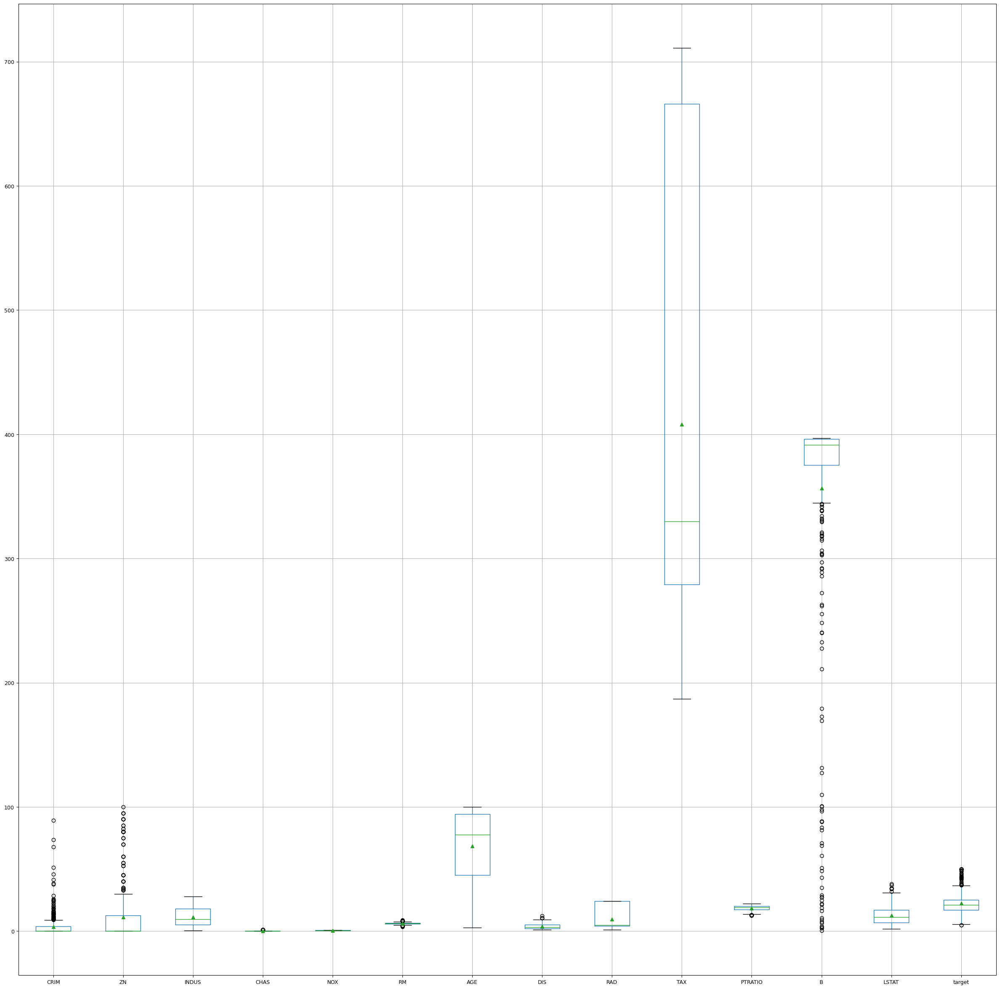

In [80]:
ax = df_boston.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

In [81]:
df_boston.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,target
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


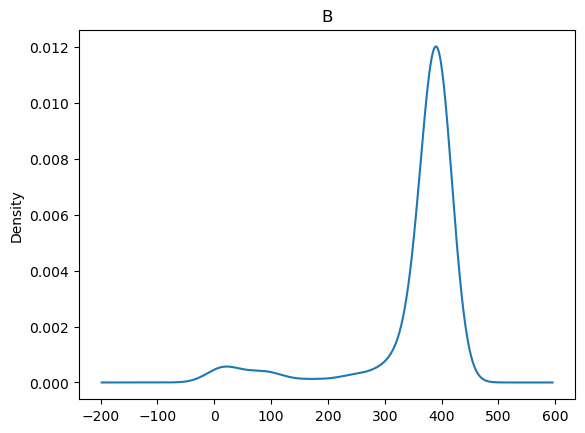

In [82]:
feature = 'B'
ax = df_boston[feature].plot(kind='density')
_=ax.set_title(feature)

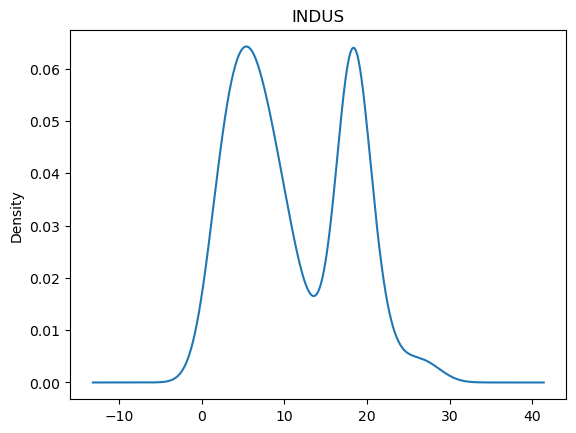

In [83]:
feature = 'INDUS'
ax = df_boston[feature].plot(kind='density')
_=ax.set_title(feature)

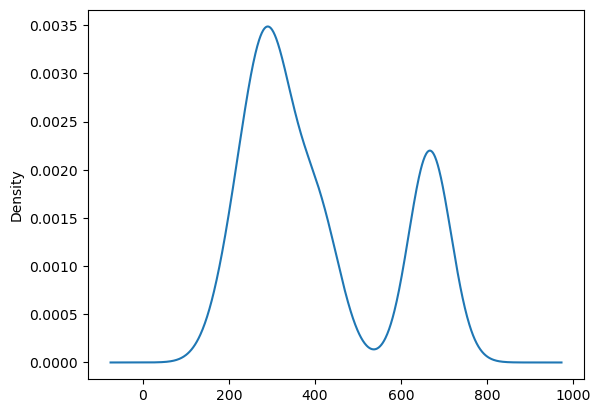

In [84]:
_ = df_boston['TAX'].plot(kind='density')

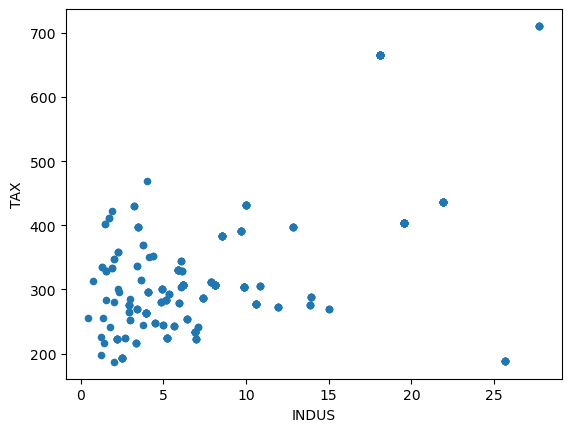

In [85]:
feature_x = 'INDUS'
feature_y = 'TAX'

df_reduced = df_boston[[feature_x,feature_y,'target']]
ax=df_reduced.plot(x=feature_x, y=feature_y, kind='scatter')


### <font color='blus'>Multivariate analysis

Text(595.7222222222223, 0.5, 'Y-Axis')

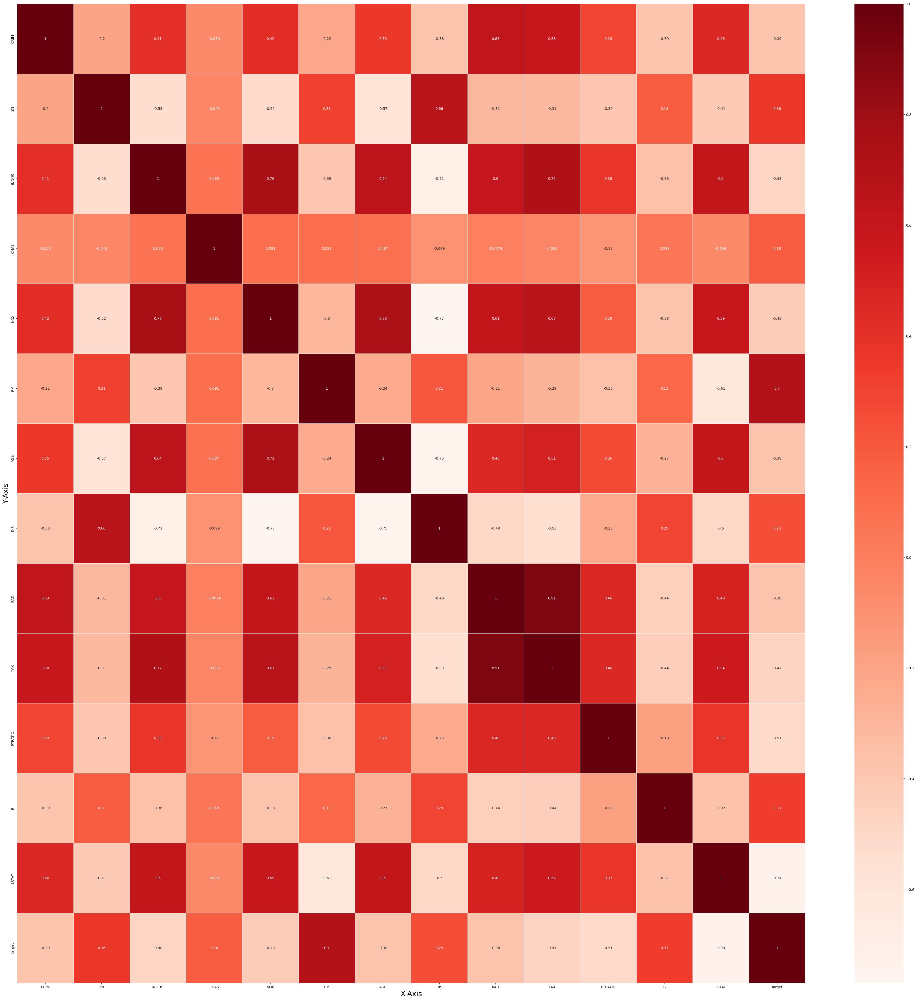

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(50,50)) 
df_corr = df_boston.corr()
ax = sns.heatmap(df_corr, cmap="Reds", annot=True, linewidths=.5, ax=ax)
ax.set_xlabel('X-Axis', fontsize=20)
ax.set_ylabel('Y-Axis', fontsize=20)

> Correlations make reference to **information** that features do **share**. When variables are correlated, then they bring less information to the model then if they where not.
>
> Correlated variables may increase the errors produced by some algorithms such as linear algorithm.
>
> **Note that correlation is not causation**. Correlated features does not mean that there is a causal relationship between features.
>
> Correlations values ranged into interval $[-1,1]$. This is a normalization of a statistic, the **variance**.
>
> When correlated values are > 0, this mean their variability are in the same direction. Otherwise, their variability are in the opposite directions.
> 

### <font color='blus'>KNN for regression

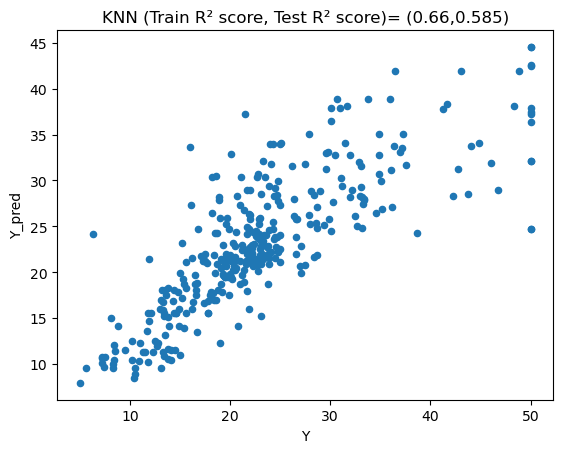

In [87]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=5,p=2)
pct_train_size = 0.7
X,y = get_X_y(df_boston)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=pct_train_size, random_state=42)
knn.fit(X_train, y_train.ravel())
y_train_predict = knn.predict(X_train)
df_plot = pd.DataFrame(data = {'Y':y_train.ravel(), 'Y_pred':y_train_predict.ravel()})

ax=df_plot.plot(x='Y', y='Y_pred', kind='scatter')
r2_train = np.round(knn.score(X_train, y_train),3)
r2_test  = np.round(knn.score(X_test, y_test),3)

_=ax.set_title("KNN (Train R² score, Test R² score)= ({},{})".format(r2_train,r2_test))

#### <font color='blus'>Fit, score, predict methods

> - In scikitlearn packages, learning algorithms have the `fit` method. Fit refers to the capacity of the algorithm to match with the function producing output values from input values. This is the `train` step.
>> - In KNN, this step consists only in recording the train dataset model.
>
> - `predict` method do... the prediction job!
>
>
> - `score` method, for regression algorithm, leads to $R^2$ computation that provides the proportion of the variation (variance) in the dependant variable, `y`, that is predictable by the independants variables, 'X'

### <font color='blus'>Scaling variables

#### <font color='blus'>Min Max scaler

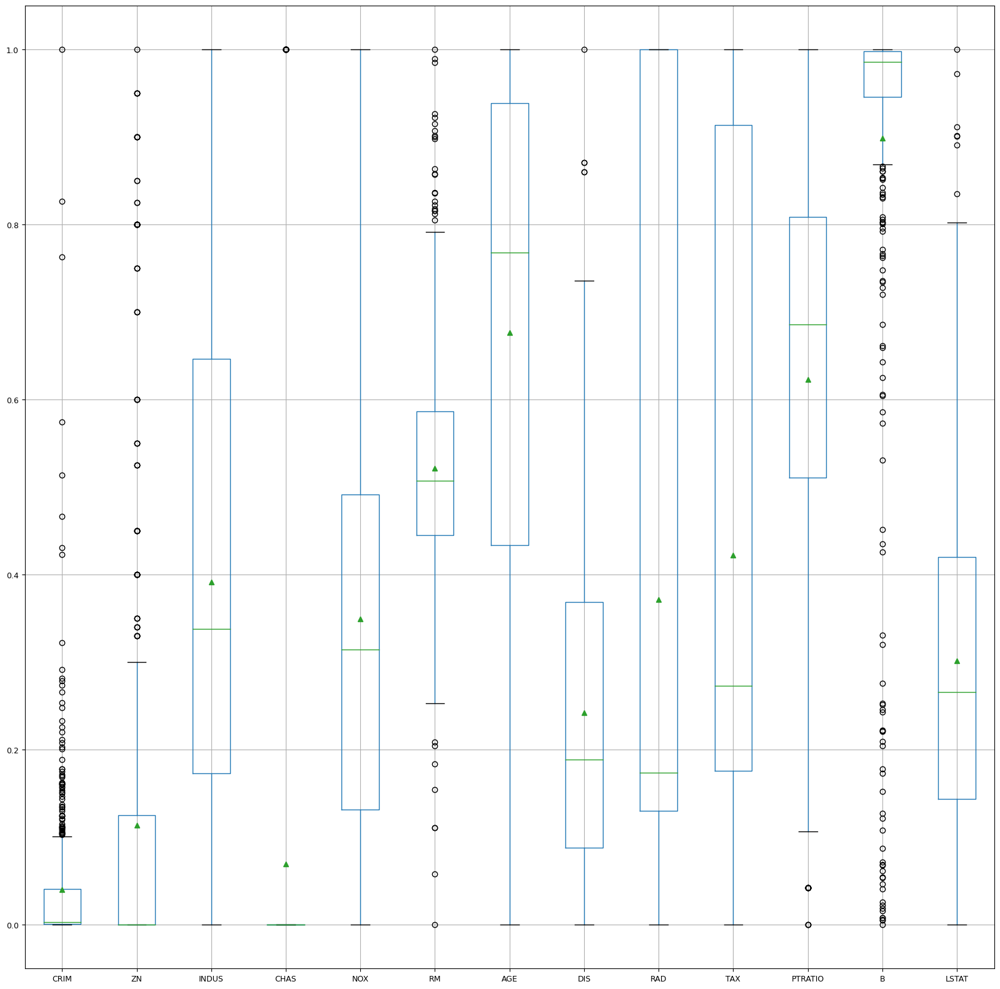

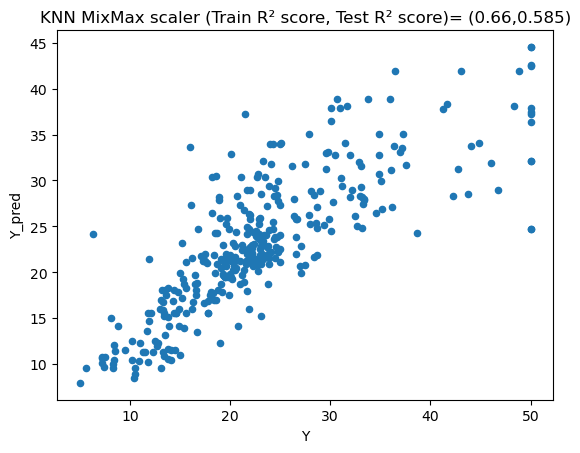

In [88]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor

trans = MinMaxScaler()
X,y = get_X_y(df_boston)
X_trans = trans.fit_transform(X)
df_X_trans = pd.DataFrame(data=X_trans, columns = df_boston.columns[:-1])

ax = df_X_trans.boxplot(fontsize=9, showmeans=True, figsize=(20,20))

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=pct_train_size, random_state=42)

knn = KNeighborsRegressor(n_neighbors=5,p=2)
pct_train_size = 0.7
X,y = get_X_y(df_X_trans)
knn.fit(X_train, y_train.ravel())
y_train_predict = knn.predict(X_train)
df_plot = pd.DataFrame(data = {'Y':y_train.ravel(), 'Y_pred':y_train_predict.ravel()})

ax=df_plot.plot(x='Y', y='Y_pred', kind='scatter')
r2_train = np.round(knn.score(X_train, y_train),3)
r2_test  = np.round(knn.score(X_test, y_test),3)

_=ax.set_title("KNN MixMax scaler (Train R² score, Test R² score)= ({},{})".format(r2_train,r2_test))

#### <font color='blus'>Standard scaler

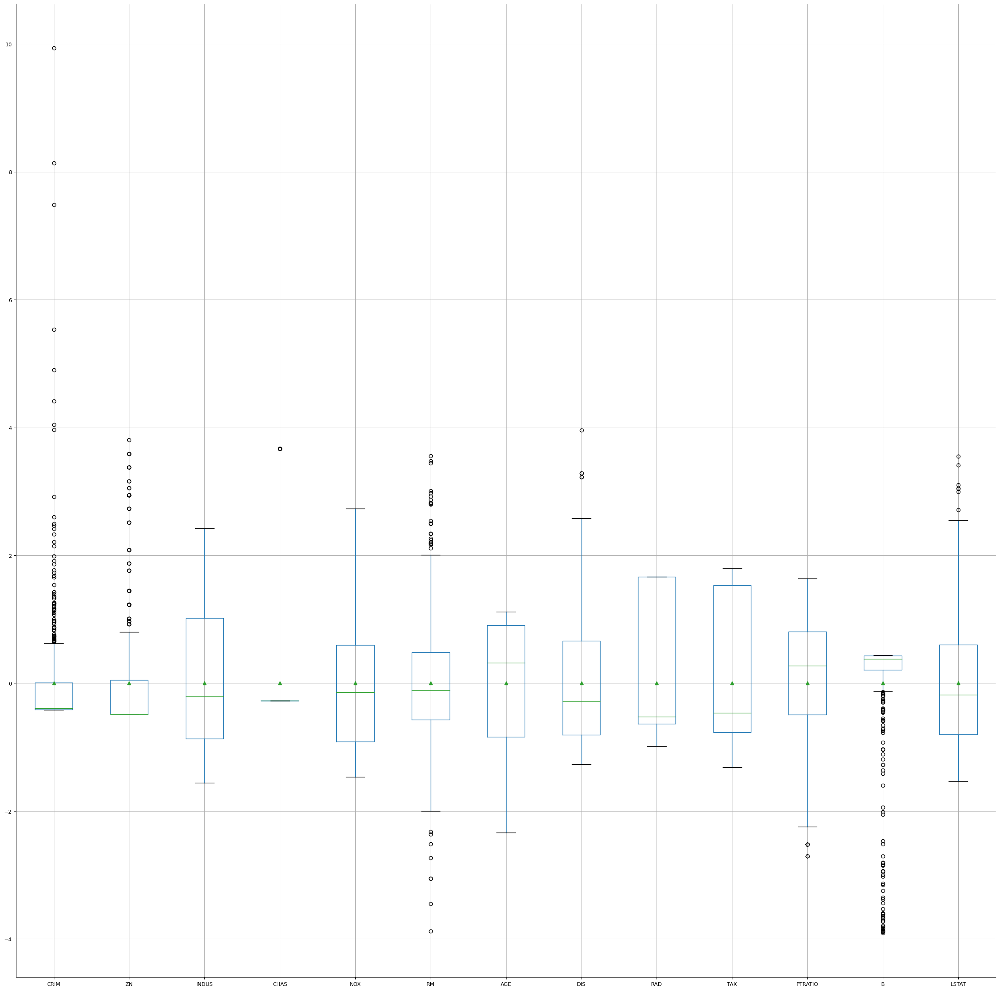

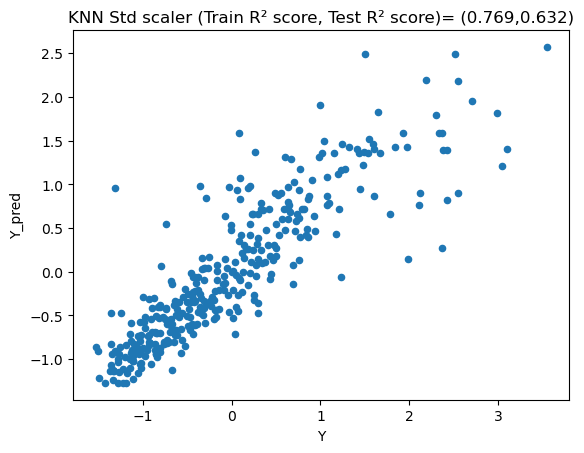

In [89]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor

trans = StandardScaler()
X,y = get_X_y(df_boston)
X_trans = trans.fit_transform(X)
df_X_trans = pd.DataFrame(data=X_trans, columns = df_boston.columns[:-1])
ax = df_X_trans.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

knn = KNeighborsRegressor(n_neighbors=5,p=2)
pct_train_size = 0.7
X,y = get_X_y(df_X_trans)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=pct_train_size, random_state=42)
knn.fit(X_train, y_train.ravel())
y_train_predict = knn.predict(X_train)
df_plot = pd.DataFrame(data = {'Y':y_train.ravel(), 'Y_pred':y_train_predict.ravel()})

ax=df_plot.plot(x='Y', y='Y_pred', kind='scatter')
r2_train = np.round(knn.score(X_train, y_train),3)
r2_test  = np.round(knn.score(X_test, y_test),3)

_=ax.set_title("KNN Std scaler (Train R² score, Test R² score)= ({},{})".format(r2_train,r2_test))

#### <font color='blus'>Yeo-Jhonson transformer

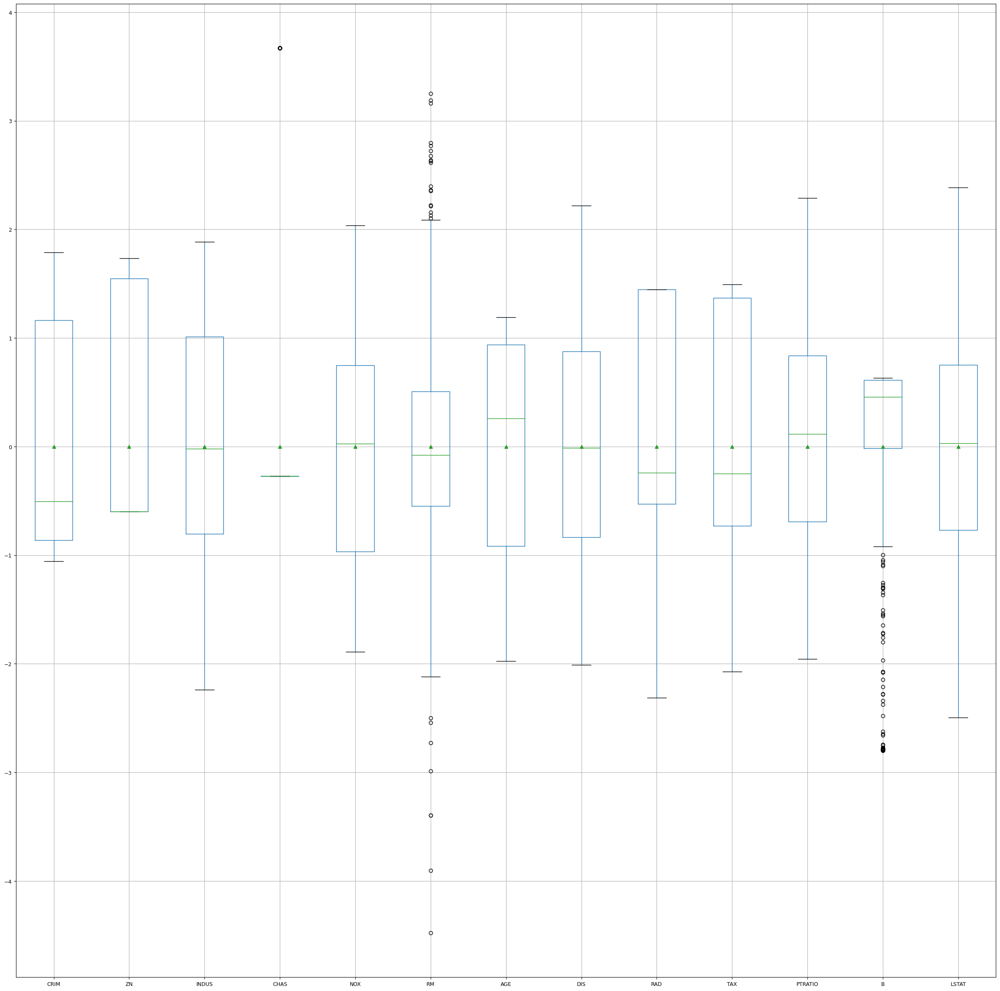

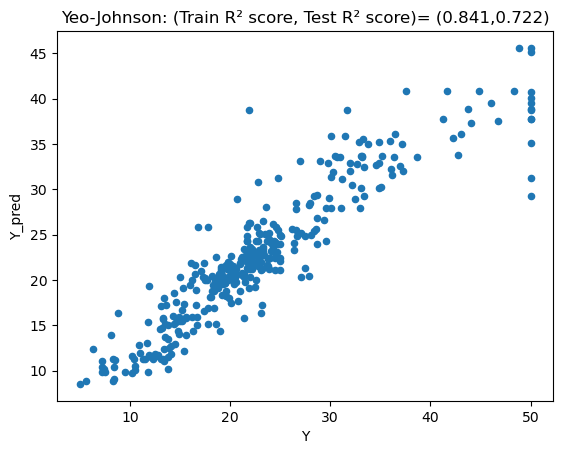

In [90]:
from scipy.stats import boxcox
from sklearn.preprocessing import PowerTransformer
from sklearn.neighbors import KNeighborsRegressor

powerTransformer = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)

X,y = get_X_y(df_boston)
X_trans = powerTransformer.fit_transform(X)
df_X_trans = pd.DataFrame(data=X_trans, columns=df_boston.columns[:-1])
ax = df_X_trans.boxplot(fontsize=9, showmeans=True, figsize=(30,30))

X_train, X_test, y_train, y_test = train_test_split(X_trans, y, train_size=pct_train_size, random_state=42)
knn = KNeighborsRegressor(n_neighbors=5,p=2)
pct_train_size = 0.7
knn.fit(X_train, y_train.ravel())
y_train_predict = knn.predict(X_train)
r2_train = np.round(knn.score(X_train, y_train),3)
r2_test  = np.round(knn.score(X_test, y_test),3)

df_plot = pd.DataFrame(data = {'Y':y_train.ravel(), 'Y_pred':y_train_predict.ravel()})
ax=df_plot.plot(x='Y', y='Y_pred', kind='scatter')


_=ax.set_title("Yeo-Johnson: (Train R² score, Test R² score)= ({},{})".format(r2_train,r2_test))

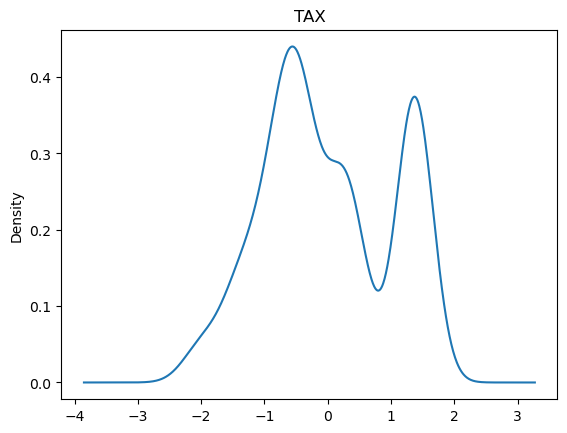

In [91]:
feature = 'TAX'
ax = df_X_trans[feature].plot(kind='density')
_=ax.set_title(feature)

## <font color='blus'>Algorithms qualification

> While making predictions with linear algorithm, followings results have been obtained
>
> Scoring KNN algorithm :
> - `(R² Train, R² Test)= (0.68, 0.57)`
>
> Scoring KNN algorithm with *Min Max scaler*:
> - `(R² Train, R² Test)= (0.68, 0.66)`
>
> Scoring KNN algorithm with *standard scaler*:
> - `(R² Train, R² Test)= (0.77, 0.63)`
>
> Scoring linear algorithm :
> - `(R² Train, R² Test)= (0.74, 0.71)`
>
> Scoring linear algorithm with *Yeo-Johnson* transformation:
> - `(R² Train, R² Test)= (0.84, 0.72)`
>

### <font color='blus'>Removing outliers

# <font color='blus'>Scoring a linear algorithm

## <font color='blus'>Linear algorithms principle

> Algorithm is said linear when a linear relation exists between values to be predicted, still named dependant variable, and variables used for predictions, named independant variables.
>
> When $Y_{pred}$ is the variable to be predicted and $(X_0,...,X_N)$ the features used for prediction, such linear relation may be expressed as : 
>> $Y_{pred} = a_0\times X_O + a_1\times X_1 + ... + a_N\times X_N + \beta$
>
> Then the linear algorithm aims to compute $(a_0,...,a_N)$ with **statistical methods**. And most of this statistical methods, such as Ordinary Least Square (OLS) error are based on asumption of Gaussian distributions.
>
> On the opposite, when features behave as Gaussians distributions then it is likely that linear algorithm provide significant performances. 
>
> This for this reason transformations such as `PowerTransformation` may lead to better results using linear algorithm.

## <font color='blus'>Scoring regression

> When predicted values match values to be predicted, then curve representing $(Y, Y_{pred})$ points are strongly correlated and this correlation is measured with a statistic named $R^2$ score.
>
> Scoring is performed with R² assessment.
>
> In the followings examples, linear algorithm is scored without and with features transformation.

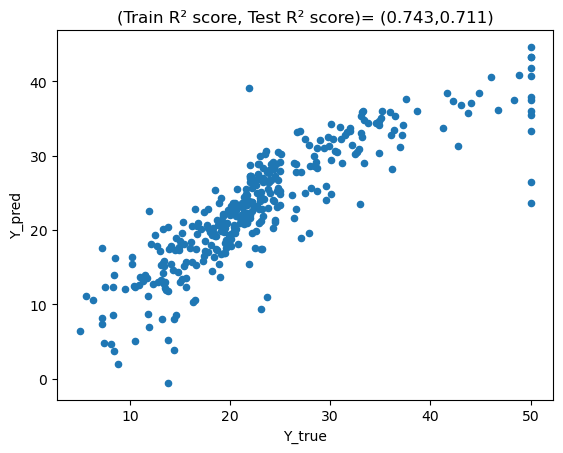

In [92]:
from sklearn import linear_model

X,y = get_X_y(df_boston)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=pct_train_size, random_state=42)

lreg = linear_model.LinearRegression()
lreg.fit(X_train, y_train)
y_train_predict = lreg.predict(X_train)
y_test_predict  = lreg.predict(X_test)

df_plot = pd.DataFrame(data = {'Y_true':y_train.ravel(), 'Y_pred':y_train_predict.ravel()})
ax=df_plot.plot(x='Y_true', y='Y_pred', kind='scatter')
r2_train = np.round(lreg.score(X_train, y_train),3)
r2_test  = np.round(lreg.score(X_test,  y_test),3)

_=ax.set_title("(Train R² score, Test R² score)= ({},{})".format(r2_train,r2_test))

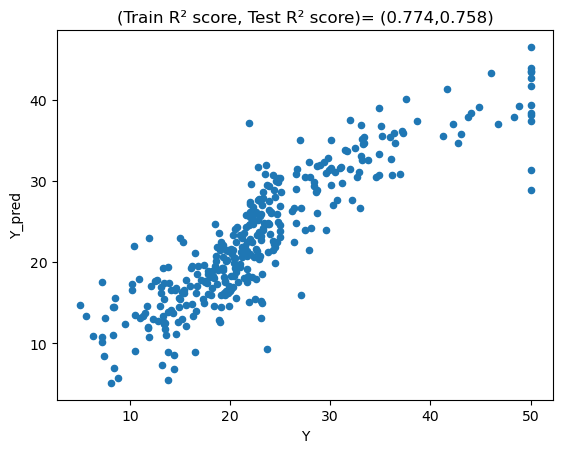

In [93]:
from sklearn.preprocessing import PowerTransformer
from sklearn import linear_model

X,y = get_X_y(df_boston)
powerTransformer = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)

X_trans = powerTransformer.fit_transform(X)
df_X_trans = pd.DataFrame(data=X_trans, columns=df_boston.columns[:-1])

X_train, X_test, y_train, y_test = train_test_split(X_trans, y, train_size=pct_train_size, random_state=42)
reg = linear_model.LinearRegression()
pct_train_size = 0.7
reg.fit(X_train, y_train.ravel())
y_train_predict = reg.predict(X_train)
r2_train = np.round(reg.score(X_train, y_train),3)
r2_test  = np.round(reg.score(X_test, y_test),3)

df_plot = pd.DataFrame(data = {'Y':y_train.ravel(), 'Y_pred':y_train_predict.ravel()})
ax=df_plot.plot(x='Y', y='Y_pred', kind='scatter')


_=ax.set_title("(Train R² score, Test R² score)= ({},{})".format(r2_train,r2_test))

## <font color='blus'>Scoring regression without correlations

# <font color='blus'>Underfitting, overfitting, generalization

## <font color='blus'>Presentation

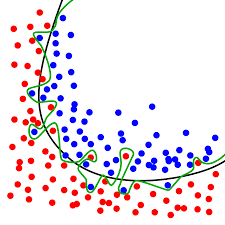

> On the picture above, an algorithm that draws green curve is said "**overfitting**"
>
> Also, an algorithm that draws black curve is said "**underfitting**"
>
> The red curve takes care of every point to separate blue points from red ones. Algorithm has learnt exactly how to identify red points from blue one. This learning process is based on $N$ observations described with $p$ features, mean, $p$ dimensions.
>
> Suppose that to achieve a such result, algorithm has recorded all relatives positions and many other things with a learning mechanism equivalent to something looking like a "point per point" rule based algorithm. Such algorithm will involve a lot of parameters and the more parameters it has, the more **complex** the algorithm is said to be.
>
> What's happen when a new point is added around this border line after the training step ? Due to the fact this new point has not been viewed during training, then it is likely that rules won't apply to this point leading to a false prediction.
>
> If data model is noisy, and this is always the case, then algorithm may be so complex that he also learned the noise. It will predict also noisy results.
>
> The ability for an algorithm to perform well over training dataset is said **overfitting**. 
>
> In a reverse situation, when algorithm have low performance while predicting training dataset is said **underfitting**.
>
> When an algorithm achieves good performances on training dataset and also good performances on testing dataset then it has the ability of **generalization**.  
>
> **Generalization** is the ability, for an algorithm, to learns general concepts (concepts that will be applicable on unseen data) from specific observations (from train dataset). This is a kind of "inductive" reasoning.
>
> On the opposite, deduction reasoning is the action of create knowledge, then, to learn specific concepts, from general observations. 

************************************************************************************************************************